<center>
<h1><strong>
TASK 2 - SpringerLink Discipline Prediction 
</h1>
</center>


---


Authors: 
- Pablo Reyes Martín           (NIA: 100409333)
- Claudio Sotillos Peceros     (NIA: 100409401)
- Bosco De Enrique Romeu       (NIA: 100406718)
- Daniel De Las Cuevas Turel  (NIA: 100406666)  

<a href="https://link.springer.com/">SpringerLink's page</a>

NOTE:

**The following code has an extremely high computational time**


<h1>Initialization</h1>

Let´s import all the needed libraries and tools

In [ ]:
# Common imports 
import numpy as np
import pandas as pd
import zipfile as zp
import seaborn as sns
import matplotlib.pyplot as plt
from termcolor import colored
import os
from google.colab import drive
import pickle
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier
%matplotlib inline
%config InlineBackend.figure_format = 'retina' 

#For fancy table Display
%load_ext google.colab.data_table


In [ ]:
#To wrap long text lines
from IPython.display import HTML, display

def set_css():
  display(HTML('''
  <style>
    pre {
        white-space: pre-wrap;
    }
  </style>
  '''))
get_ipython().events.register('pre_run_cell', set_css)

In [ ]:
# THE BELOW LINE CODE HIDES THE OUTPUT OF THIS CELL. IF FOR ANY REASON THIS CELLS TAKES MORE THAN A MINUTE EXECUTING
# COMMENT THE BELOW LINE AND CHECK WHAT IS HAPPENING (IT IS POSSIBLE THAT MALLET MAKES EXTRANGE THINGS DURING ITS INSTALLATION)
%%capture   

!pip install --upgrade spacy
import spacy
!python -m spacy download en_core_web_md
!pip install --upgrade gensim==3.8.3
!pip install pyLDAvis==2.1.2

import os       #importing os to set environment variable
def install_java():
    !apt-get install -y openjdk-8-jdk-headless -qq > /dev/null      #install openjdk
    os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"     #set environment variable
    !java -version       #check java version
install_java()

In [ ]:
drive.mount("/content/drive")

In [ ]:
# ¡WARNING! If you want to run the code, insert below the path where you have saved the 'Final Project' folder
local_folder = '/content/drive/MyDrive/ML Applications/Final Project/'
os.chdir(local_folder)

In [ ]:
import gensim
import ast
import gensim.downloader as api
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import seaborn as sns
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import quantile_transform
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from gensim.models import TfidfModel
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import TruncatedSVD
from scipy import sparse
from gensim.matutils import corpus2dense


In [ ]:
df_spring = pd.read_excel(local_folder + 'Task 1 CheckPoints/CheckPoint3/' +  'spring_df_15topics.xlsx')
D = gensim.corpora.Dictionary.load(local_folder + 'Task 1 CheckPoints/CheckPoint2/' + 'clean_gensim.dict')

In [ ]:
df_spring.head(1)

,Title,Lemmas,Keywords,Authors,Journal,Publication Date,Month,Year,Accesses,target,nlemmas,clean_lemmas,LDA_15,main_topic_15
0,Improved approaches for density-based outlier ...,density base algorithm important datum cluster...,"['Data analysis', 'Density clustering', 'DBSCA...",Aymen Abid & Abdennaceur Kachouri,Computing,13 January 2021,January,2021,44,Computer Science,70,density algorithm important datum clustering t...,"[(0, 0.034341127), (4, 0.100990936), (8, 0.014...",Geography 2


In [ ]:
disc_dict={'Economics':0,'Criminology and Crime Justice': 1,'Economics 2':0, 'Psychology': 2,'Physics':3,'Mathematics': 4,
           'Geography': 5,'Psychology 2': 2, 'Philosophy': 6,'Biomedicine': 7,'Education':8,'Garbage':9,'Physics 2':3,'Computer Science': 10,'Geography 2': 5 }
     
def tonum(maxdisc):
  return disc_dict[maxdisc]

In [ ]:
import ast
df_spring["main_topic_15"] = df_spring['main_topic_15'].apply(lambda x: tonum(x))

In [ ]:
import ast
def string_tolist(ls):
  return ast.literal_eval(ls)

In [ ]:
df_spring["LDA_15"] = df_spring['LDA_15'].apply(lambda x: string_tolist(x))

## 1.TF - IDF Approach

In this approach we will examine how good is the TF-IDF representation in order to predict the target. 

We will use four main classifiers: 

- Naive Bayes Classifier
- k-nearest neighbors Classifier
- Linear Support Vector Machine Classifier
- Linear Discriminant Analysis 

In each of the classifiers we will first check the performance of the TF-IDF representation performing a grid search over the hyperparameters of the classifier. The only classifier which couldn´t use the TF-IDF format was LDA since it can´t handle sparse matrices. 

Then, we will use the best parameters in order to check if is convinient to perform SVD over the TF-IDF representation. With respect to this part, the Naive Bayes Classifier couldn´t support the fact that the SVD produced some negative numbers, thus we could only test it with the other two classifiers.



In [ ]:
df_selection = df_spring[["clean_lemmas","target"]] 

In [ ]:
x_model, x_test, y_model, y_test = train_test_split(df_selection["clean_lemmas"], df_selection["target"], test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_model, y_model, test_size=0.3, random_state=42)

We decided to use SVD over other dimensionality reduction techniques to take advantage of the extraction of correlations among semantically related terms.

First we computed with which amount of components we explained the 0.8 percent of the variance and with 4500 components (which compared to 18996 components is a quite significant reduction) we explain 0.82 percent. 

In [ ]:
def bowtosparse(bowdata,shape="d"):     
      col_sparse=[]
      row_sparse=[]
      value_bow=[]
      for row in range(len(bowdata)):
        for (col,bow) in bowdata[row]:
          row_sparse.append(row)
          col_sparse.append(col)
          value_bow.append(bow)
      
      return sparse.coo_matrix((value_bow, (row_sparse, col_sparse)),shape=shape)

In [ ]:
import numpy as np
from sklearn.decomposition import TruncatedSVD

bow_train =[D.doc2bow(doc.split()) for doc in df_selection["clean_lemmas"] ]
bow_train_sparse=bowtosparse(bow_train,shape=(len(bow_train),len(D)))
train_csr = sparse.csr_matrix(bow_train_sparse)
tf=TfidfTransformer().fit(train_csr)
tftrain=tf.transform(train_csr)

print("Number of components of the original TF-IDF sparse matrix: ",tftrain.shape[1])


#We project all data using SVD to study the variance explained per number of components (instead of cross-validating the parameter)
components = 4500
print("\nVariance Kept with ",components,"components")
model = TruncatedSVD(n_components=components).fit(tftrain)
X_proj = model.transform(tftrain)

model.explained_variance_ratio_.sum()

Number of components of the original TF-IDF sparse matrix:  18996

Variance Kept with  4500 components


0.8243858336456846

In [ ]:
def evaluator(train,validation,test,y_train,y_val,y_test,gridS):
      gridS.fit(train,y_train)
      y_pred_train=gridS.predict(train)
      y_pred_valid=gridS.predict(validation)
      y_pred_test=gridS.predict(test)
      
      accuracy_train=(y_pred_train==y_train.values).tolist().count(True)/(len(y_train))
      accuracy_valid=(y_pred_valid==y_val.values).tolist().count(True)/(len(y_val))
      accuracy_test=(y_pred_test==y_test.values).tolist().count(True)/(len(y_test))
      # dictionary={"model":gridS,"acc_train":accuracy_train,"acc_val":accuracy_test,"tfidf":tf}

      return [accuracy_train,accuracy_valid,accuracy_test,gridS]

In [ ]:
bow_train =[D.doc2bow(doc) for doc in x_train.str.split().to_list()]
bow_valid =[D.doc2bow(doc_valid) for doc_valid in x_val.str.split().to_list()]
bow_test =[D.doc2bow(doc_test) for doc_test in x_test.str.split().to_list()]

bow_train_sparse=bowtosparse(bow_train,shape=(len(bow_train),len(D)))
bow_valid_sparse=bowtosparse(bow_valid,shape=(len(bow_valid),len(D)))
bow_test_sparse=bowtosparse(bow_test,shape=(len(bow_test),len(D)))

train_csr = sparse.csr_matrix(bow_train_sparse)
valid_csr = sparse.csr_matrix(bow_valid_sparse)
test_csr = sparse.csr_matrix(bow_test_sparse)


tf= TfidfTransformer().fit(train_csr)
tftrain=tf.transform(train_csr)
tfvalid=tf.transform(valid_csr)
tftest= tf.transform(test_csr)

svd_fit = TruncatedSVD(n_components=components).fit(tftrain)
train_svd = svd_fit.transform(tftrain)
valid_svd = svd_fit.transform(tfvalid)
test_svd = svd_fit.transform(tftest)

In [ ]:
tftrain

In [ ]:
tftrain.shape

### 1.1. Naive Bayes Classifier

<h4>TF-IDF</h4>

In [ ]:
param_grid = {
    'NB__fit_prior': [True,False],
    'NB__alpha': np.arange(0.01, 0.12, 0.01).tolist()
    }

pipe = Pipeline([ ('NB', MultinomialNB())])
grid_NB = GridSearchCV(pipe, param_grid, cv=5,refit=True)

results = evaluator(tftrain,tfvalid,tftest,y_train,y_val,y_test,grid_NB)    # TF-IDF 

print("Best params:", results[-1].best_params_)
print('Train Acc: ',results[0])
print('Valid Acc: ',results[1])
print('Test Acc: ',results[2])

Best params: {'NB__alpha': 0.09, 'NB__fit_prior': False}
Train Acc:  0.9266616557500268
Valid Acc:  0.8269038076152304
Test Acc:  0.8325819056206792


<h2>TF-IDF  +  SVD</h2>

The reason why we haven´t done this approach with Naive Bayes, is because when we reduce the sparse matrices, some negative numbers are generated and Naive bayes doesn´t suppport this.

### 1.2. k-nearest neighbors Classifier

<h4>TF-IDF</h4>

In [ ]:
param_grid = {
    'KNN__n_neighbors': np.arange(95, 106 , 1).tolist(),
    'KNN__weights': ["uniform","distance"],
}

pipe = Pipeline([ ('KNN', KNeighborsClassifier())])
grid_KNN = GridSearchCV(pipe, param_grid, cv=5,refit=True)

results = evaluator(tftrain,tfvalid,tftest,y_train,y_val,y_test,grid_KNN)    # TF-IDF 

print("Best params:", results[-1].best_params_)
print('Train Acc: ',results[0])
print('Valid Acc: ',results[1])
print('Test Acc: ',results[2])

Best params: {'KNN__n_neighbors': 100, 'KNN__weights': 'distance'}
Train Acc:  1.0
Valid Acc:  0.7758016032064128
Test Acc:  0.781785392245266


<h4>TF-IDF  +  SVD</h4>

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=100,weights='distance')
results = evaluator(train_svd,valid_svd,test_svd,y_train,y_val,y_test,KNN)    # TF-IDF 

print('Train Acc: ',results[0])
print('Valid Acc: ',results[1])
print('Test Acc: ',results[2])

Train Acc:  1.0
Valid Acc:  0.7685370741482966
Test Acc:  0.780282536819958


### 1.3. Linear Support Vector Machine Classifier

<h4>TF-IDF </h4>

In [ ]:
param_grid = {
    'SGD__loss': ["hinge", "log", "modified_huber","squared_hinge","perceptron"],
    'SGD__penalty':["l2", "l1"],

}

pipe = Pipeline([('SGD', SGDClassifier(alpha=1e-3, random_state=42))])
grid_SGD = GridSearchCV(pipe, param_grid, cv=5,refit=True)

results = evaluator(tftrain,tfvalid,tftest,y_train,y_val,y_test,grid_SGD)    # TF-IDF 

print("Best params:", results[-1].best_params_)
print('Train Acc: ',results[0])
print('Valid Acc: ',results[1])
print('Test Acc: ',results[2])

Best params: {'SGD__loss': 'modified_huber', 'SGD__penalty': 'l2'}
Train Acc:  0.9245141200472458
Valid Acc:  0.8334168336673347
Test Acc:  0.8379921851517884


<h4>TF-IDF + SVD</h4>

In [ ]:
SVM = SGDClassifier(loss="modified_huber",penalty= "l2",alpha=1e-3, random_state=42)
results = evaluator(train_svd,valid_svd,test_svd,y_train,y_val,y_test,SVM)    # TF-IDF 


print('Train Acc: ',results[0])
print('Valid Acc: ',results[1])
print('Test Acc: ',results[2])

Train Acc:  0.9123805433265328
Valid Acc:  0.8324148296593187
Test Acc:  0.8358881875563571


### 1.4. Linear Discriminant Analysis

<h4>TF-IDF</h4>

Linear Discriminant Analysis can´t handle sparse matrices, that is why we haven´t been able to apply just on TF-IDF. Thus we will use the SVD transformed versión of the TF-IDF in order to compute it. 

<h4>TF-IDF + SVD</h4>

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
param_grid = {
    'LDA__solver': ["svd", "lsqr", "eigen"],
}

pipe = Pipeline([('LDA', LinearDiscriminantAnalysis())])
grid_LDA = GridSearchCV(pipe, param_grid, cv=5,refit=True)

grid_LDA.fit(train_svd,y_train)
y_pred_test=grid_LDA.predict(test_svd)
accuracy_test=(y_pred_test==y_test.values).tolist().count(True)/(len(y_test))

print("Best params:", grid_LDA.best_params_)
print('Test Acc: ',accuracy_test)

Best params: {'LDA__solver': 'svd'}
Test Acc:  0.8322813345356177


In [ ]:
y_pred_train=grid_LDA.predict(train_svd)
y_pred_valid=grid_LDA.predict(valid_svd)
y_pred_test=grid_LDA.predict(test_svd)

accuracy_train=(y_pred_train==y_train.values).tolist().count(True)/(len(y_train))
accuracy_valid=(y_pred_valid==y_val.values).tolist().count(True)/(len(y_val))
accuracy_test=(y_pred_test==y_test.values).tolist().count(True)/(len(y_test))

print('Train Acc: ',accuracy_train)
print('Valid Acc: ',accuracy_valid)
print('Test Acc: ',accuracy_test)

Train Acc:  0.9847524965102545
Valid Acc:  0.8223947895791583
Test Acc:  0.8322813345356177


## 2.Word2Vec + TSNE

The word2vec model enables us to vectorize words embedding their semantic information. We decided to make this approach the next part of our study.

To implement this unsupervised learning method, we used a neural network pretrained with a very large number of training samples and providing vector words of length 300. This word2vec NN  has been loaded from the gensim documentation. 
You can see where the link is got from:
https://radimrehurek.com/gensim/auto_examples/tutorials/run_word2vec.html  







<h3><strong>For loading the below word2vec model, you will need to be connected to internet. Also warn you that it will take some minutes.</h3>

In [ ]:
wv = api.load('word2vec-google-news-300')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


### 2.1 Pipeline for vector representation of documents

Our intuition was to use the word2vec model to get a new representation for our documents.

To do so, for each document, we map all the words of the abstract using word2vec. Once we have all the word-embeddings, we follow two different strategies to get the representation of the document (that are indeed feasible as all vectors have length 300):

- We average the abstract words embeddings.
- We sum the abstract word embedding.

Resulting in a corpus matrix with $N$ rows and 300 columns where $N$ is the total size of the corpus and 300 the size of our doc embeddings.

In [ ]:
### AVERAGE APPROACH OF THE MODEL
def doc2vec(x):
  ### IF THERE IS AT LEAST ONE TOKEN IN THE DOCUMENT
  if len(x)>0:

    l=[]
    ## WE LOOK FOR EACH  REPRESENTATION INSIDE THE PRETRAINED MODEL
    for word in x:
      ## WE ATTEMPT TO CONVERT THE WORD2 A VECTOR BUT IF THE PRETRAIN MODEL DOES NOT FIND THE WORD
      ## WE PASS TO THE SEARCH OF THE NEXT WORD2VEC WORD
      try:
        l.append(wv[word])
      except KeyError:
        continue 
    ## IF THE AVERAGE OF THE WORD EMBEDDINGS DOES NOT CONTAIN ANY INFO 
    ## WE RETURN NONE
    if len(l)==0 or np.mean(l,axis=0).tolist()==0:
      return None
    ## OTHERWISE WE IMPLEMENT THE FIRST APPROACH WHICH IS TAKING THE AVERAGE OF AL THE WORD EMBEDDINGS
    ## OF A DOCUMENT AND THIS IS GOING TO BE THE DOC REPRESENTATION
    else:
      return np.mean(np.array(l),axis=0).tolist()
  ## IF THERE IS NO TOKEN
  else:
    return None




### SUM APPROACH OF THE MODEL

## EVERYTHING IS EQUALLY IMPLEMENTED BUT THE REPRESENTATION OF A DOCUMENT IS NOT THE AVERAGE
## OF VECTOR WORDS BUT IT IS THE SUM
def doc2vecsum(x):
  if len(x)>0:
    l=[]
    for word in x:
      try:
        l.append(wv[word])
      except KeyError:
        continue 
    ## SUM APPROACH
    if len(l)==0 or np.sum(l,axis=0).tolist()==0:
      return None
    else:
      return np.sum(np.array(l),axis=0).tolist()
  else:
    return None




#### 2.1.1 Scaling Word2Vec Document Embeddings

We scale the embeddings (using training data)

In [ ]:
def scalingdata(train,test):
  ## SCALER FUNCTION
  scaler = StandardScaler()
  scaler.fit(train)
  ## WE SCALE THE DATA
  x_train = scaler.transform(train)
  x_test =scaler.transform(test)
  return x_train,x_test

#### 2.1.2 TSNE (T-Distributed Stochastic Neighbor Embedding)
This reduction is an stochastic statistical technique used to represent categories onto a reduced spatial dimensions. Specially it is used to represent different context of words embeddings and for that reason we have applied it. 


In [ ]:
def reducetoTSNE(train,test,n_c=2,per=30):
      ### TSNE FUNCTION IMPLEMENTATION
      size_train = train.shape[0]
      ### WE VERTICALLY STACK ALL THE DATA OBSERVTIONS
      X = np.vstack((train,test))
      ### WE REDUCE THE WORD-VECTOR REPRESENTATIONS ONTO A LOW DIMENSIONAL SPACE
      X_tsne = TSNE(n_components=n_c,perplexity=per, random_state=0).fit_transform( X )
      ## WE AGAIN SPLIT THE TSNE INTO THE TRAIN AND TEST DATA THAT WAS STABLISHED BEFORE 
      X_train_tsne = X_tsne[0:size_train,:]
      X_test_tsne  = X_tsne[size_train:,:]
      return X_train_tsne,X_test_tsne

#### 2.1.3 Implementation of both approaches
To have a more compact process we have merge all these stpes into two different function (one for each different approach) so that the mechanic is the same:
1. Using one approach to convert words of the documents to vectors (average or mean)
2. Scaling the data
3. Reduce the dimensions with TSNE

In [ ]:
def word2tsne(corpustrain,corpustest,y_train,y_test,n_c=2,per=30):
  ### CONVERT DOCUMENTS TO VEC BY THE AVERAGE  OF ABSTRACT WORDS
  train=corpustrain.apply(doc2vec)
  test=corpustest.apply(doc2vec)
  ### REMOVE ALL NONE VALUES (VALUES WHOSE DOCUMENT IS NULL OR THERE IS NO WORD OF THE DOCUMENT
  ### THAT WERE FING IN THE NN MODEL)
  train.dropna(axis=0,inplace=True)
  test.dropna(axis=0,inplace=True)

  
  ### UPDATE THE TARGET VALUES

  y_train=y_train[train.index.values]
  y_test=y_test[test.index.values]

  ### CONVERT PD SERIES TO NUMPY FOR SCALING COMPUTATION
  arraytrain=np.array(train.to_list())
  arraytest=np.array(test.to_list())
  
  ### SCALE THE DATA
  sc_train,sc_test=scalingdata(arraytrain,arraytest)
  ### REDUCE THE DIMENSIONS TO GET TSNE
  tsne_train,tsne_test=reducetoTSNE(sc_train,sc_test,n_c,per)

  return tsne_train,tsne_test,y_train,y_test

  

In [ ]:
def word2tsnesum(corpustrain,corpustest,y_train,y_test,n_c=2,per=30):
  ### CONVERT DOCUMENTS TO VEC BY THE SUM  OF ABSTRACT WORDS
  train=corpustrain.apply(doc2vecsum)
  test=corpustest.apply(doc2vecsum)
  ### REMOVE ALL NONE VALUES (VALUES WHOSE DOCUMENT IS NULL OR THERE IS NO WORD OF THE DOCUMENT
  ### THAT WERE FING IN THE NN MODEL)
  train.dropna(axis=0,inplace=True)
  test.dropna(axis=0,inplace=True)

  
  ### UPDATE THE TARGET VALUES

  y_train=y_train[train.index.values]
  y_test=y_test[test.index.values]

  ### CONVERT PD SERIES TO NUMPY FOR SCALING COMPUTATION
  arraytrain=np.array(train.to_list())
  arraytest=np.array(test.to_list())
  
  ### SCALE THE DATA
  sc_train,sc_test=scalingdata(arraytrain,arraytest)
  ### REDUCE THE DIMENSIONS TO GET TSNE
  tsne_train,tsne_test=reducetoTSNE(sc_train,sc_test,n_c,per)

  return tsne_train,tsne_test,y_train,y_test

  

#### 2.1.4 Extra functions for Word2TSNE 
Some functions that we have need apart from the pipeline are used to facilitate the pipeline process as well as plotting TSNE representations

In [ ]:
## CLEAN A CORPUS OF WORDS TO STRINGS
def tolist(x):
  ## THIS LIST INSIDE  A STRING IS CONVERTED INTO LIST
  x = ast.literal_eval(x)
  ## WE REMOVE SPACES SO THAT EACH TOKEN WERE JUST THE WORD
  x = [n.strip() for n in x]
  ## WE CONVERT THE TOKES TO STRING
  x= " ".join(x).strip().split()
  return x

In [ ]:
### FUNCTION TO PLOT TSNE REPRESENTATION IN TWO DIMENSIONS
def plot2dandreturndf(data,target):
  df=pd.DataFrame({"x":data[:,0].tolist(),"y":data[:,1].tolist(),"label":target.to_list()})
  fig, ax = plt.subplots(figsize=(12,10))
  sns.scatterplot(x="x", y="y",data=df,hue="label",ax=ax)
  plt.show()
  return df


In [ ]:
### FUNCTION TO PLOT TSNE 3D REPRESENTATIONS
def plottingin3d(tsne_train_3d,y_train_3d):

    # We define the parameters of our dataset
    x = tsne_train_3d[:,0]
    y = tsne_train_3d[:,1]
    z = tsne_train_3d[:,2]
    lookupTable, indexed_dataSet = np.unique(y_train_3d, return_inverse=True)
    cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())
    # We  call to the figfunction and we make the scatterplot
    fig = plt.figure(figsize = (12, 8))
    ax = plt.axes(projection ="3d")

  
    sc=ax.scatter3D(x, y, z,c=indexed_dataSet,cmap=cmap)
    lis=[]
    for i in range(len(sc.legend_elements()[1])):
      lis.append( '$\\mathdefault{'+str(lookupTable[i])+'}$')
    plt.legend(*(sc.legend_elements()[0],lis), bbox_to_anchor=(1.05, 1), loc=2)
    plt.title("N_components in 3D")

    # show plot
    plt.show()

### 2.2 Execution of Word2TSNE pipeline
For the execution of our first task we have used three different corpus:
- Keywords corpus: Metadata (most relevant words). We decided to apply only a tokenization as we believed that all words were important.
- Abstracts corpus: Corresponding to the abstracts obtained in the topic modelling task. It is passed through the preprocessing pipeline made in task 1.
- Titles corpus: these are the titles of each document and we considered that it was necessary to preprocess them to retain exclusively lemmatized nouns


*WARNING!!! High Computation time.*

In [ ]:
### WE LOAD THE DATAFRAME 
df_spring = pd.read_excel(local_folder+ 'Task 1 CheckPoints/CheckPoint3/'  + 'spring_df_15topics.xlsx')
### WE TOKENIZE THE KEYWORDS
df_spring["Keywords"]=df_spring["Keywords"].apply(tolist)
### WE ALSO TOKENIZE THE LEMMAS PREPROCESSED
df_spring["clean_lemmas"]=df_spring["clean_lemmas"].str.split().to_list()
### WE USE THIS DATA TO EXECUTE OUR TASK
data=df_spring.drop(["target"],axis=1)

In [ ]:
### WE SPLIT THE DATA INTO TRAIN AND TEST
x_train, x_val, y_train, y_val = train_test_split(data, df_spring["target"], test_size=0.3, random_state=42)

#### 2.2.1 Keywords 2D
This is the first approach that we have run and the unique one that we have dared to do a tsne representation with two and three dimensions.
We have observe that the dimensionality reduction step takes a long time in finishing and for more components you want to represent the vector document representations, more time you spend in getting the dimensionality reduction.

##### MEAN APPROACH


In [ ]:
### AND WE APPLY THE PIPELINDE EXPLAINED BEFORE TO REPRESNT THE DOCUMENT
tsne_train,tsne_test,y_train2d,y_test2d=word2tsne(x_train["Keywords"],x_val["Keywords"],y_train,y_val,n_c=2,per=35)

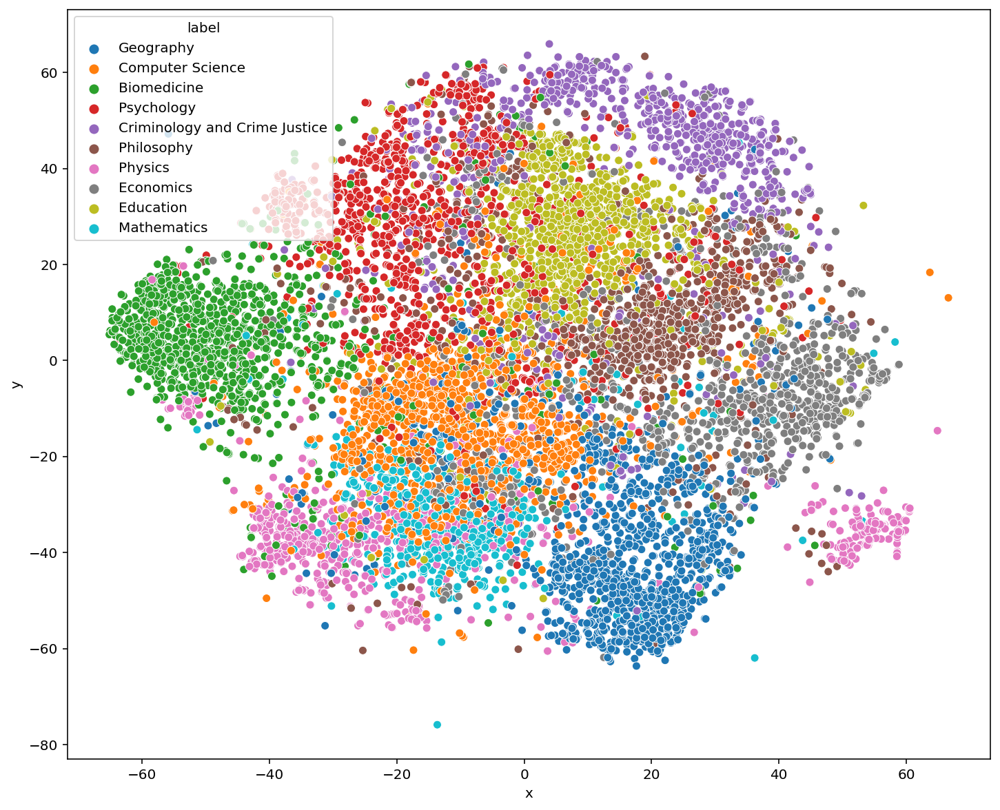

In [ ]:
dftemp=plot2dandreturndf(tsne_train,y_train2d)

In [ ]:
### READING THE RESULTS TO A PICKLE
import pickle 
with open(local_folder+'Task 2 CheckPoints/'+'keywords1.pickle', 'rb') as handle:
    key2d=pickle.load(handle)

##### SUM APPROACH


In [ ]:
tsne_trainsum,tsne_testsum,y_train2dsum,y_test2dsum=word2tsnesum(x_train["Keywords"],x_val["Keywords"],y_train,y_val,n_c=2,per=35)

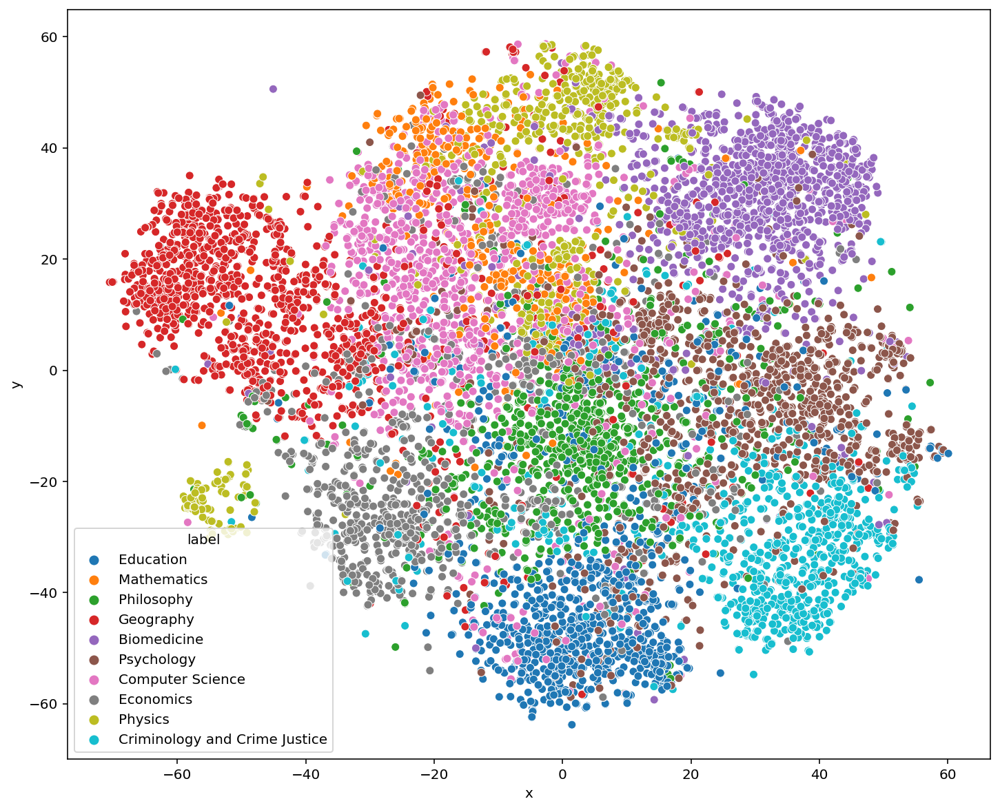

In [ ]:
dftempsum=plot2dandreturndf(tsne_trainsum,y_train2dsum)

#### 2.2.2 Keywords 3D  (MEAN APPROACH)
This reduction has only been represented with the average of all the words of a document, just to visualize the documents in three dimensions. It has taken a long time, therefore we have forgotten to make again for the other corpuses. It is recommended that do not load this code because it may last more than 30 minutes.

In [ ]:
tsne_train_3d,tsne_test_3d,y_train_3d,y_test_3d=word2tsne(x_train["Keywords"],x_val["Keywords"],y_train,y_val,n_c=3,per=30)

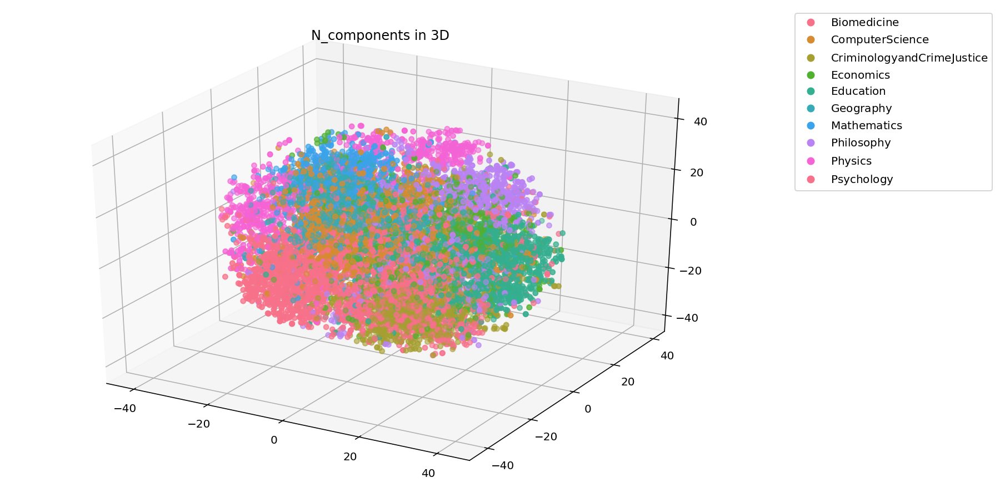

In [ ]:
plottingin3d(tsne_train_3d,y_train_3d)

In [ ]:
## READING THE RESULTS TO A PICKLE
import pickle 
with open(local_folder + 'Task 2 CheckPoints/'+'keywords3d.pickle', 'rb') as handle:
    key3d=pickle.load(handle)

#### 2.2.3 Clean Lemmas 2D
This second approach is more interesting than the first one in terms of representation. We can see that documents are better organized by their disciplines and better distributed. That may be caused by the well preprocessed made in task 1 as well as we have more information to project each document onto a two dimensional real space (abstracts have much more length than keywords).
Even though the encoded space captures better the correlation than with keywords corpus. We realize that for instance, maths and physics overlaps between them and that makes sense because both scopes are very related!!!.

##### MEAN APPROACH

In [ ]:
tsne_cltrain,tsne_cltest,cl_ytrain,cl_ytest=word2tsne(x_train["clean_lemmas"],x_val["clean_lemmas"],y_train,y_val,n_c=2,per=35)

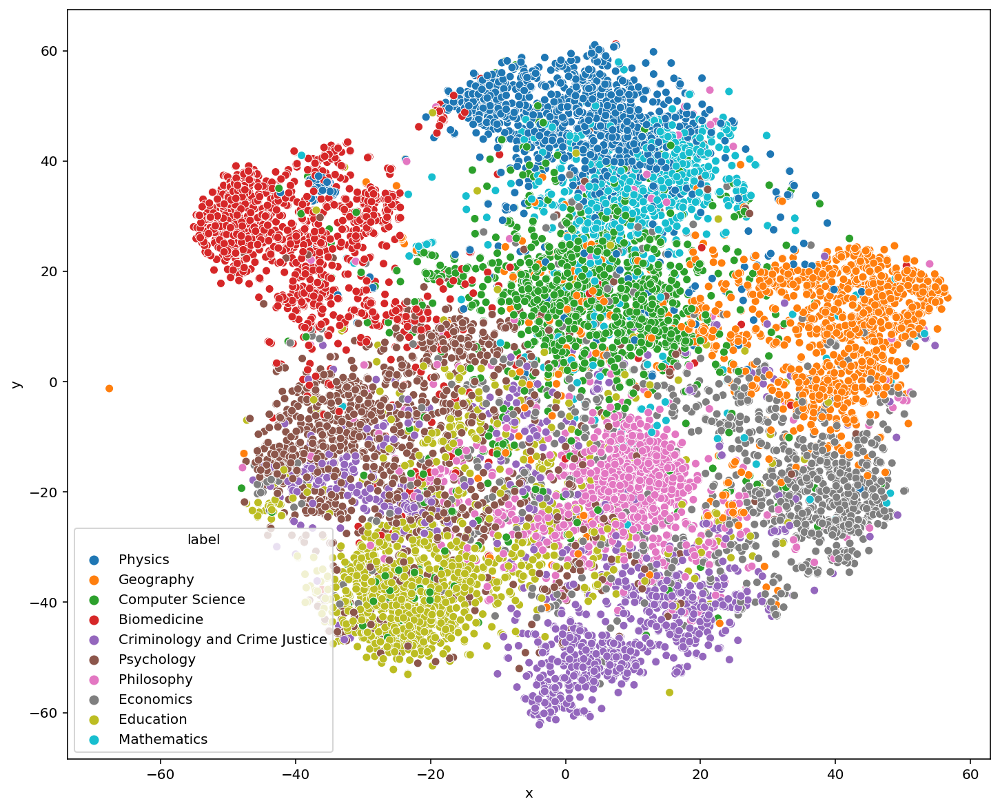

In [ ]:
cltemp=plot2dandreturndf(tsne_cltrain,cl_ytrain)

In [ ]:
## READING THE RESULTS TO A PICKLE
import pickle 
with open(local_folder+'Task 2 CheckPoints/'+'cl2d.pickle', 'rb') as handle:
    clemmas2d=pickle.load(handle)

##### SUM APPROACH

In [ ]:
tsne_cltrainsum,tsne_cltestsum,cl_ytrainsum,cl_ytestsum=word2tsnesum(x_train["clean_lemmas"],x_val["clean_lemmas"],y_train,y_val,n_c=2,per=35)

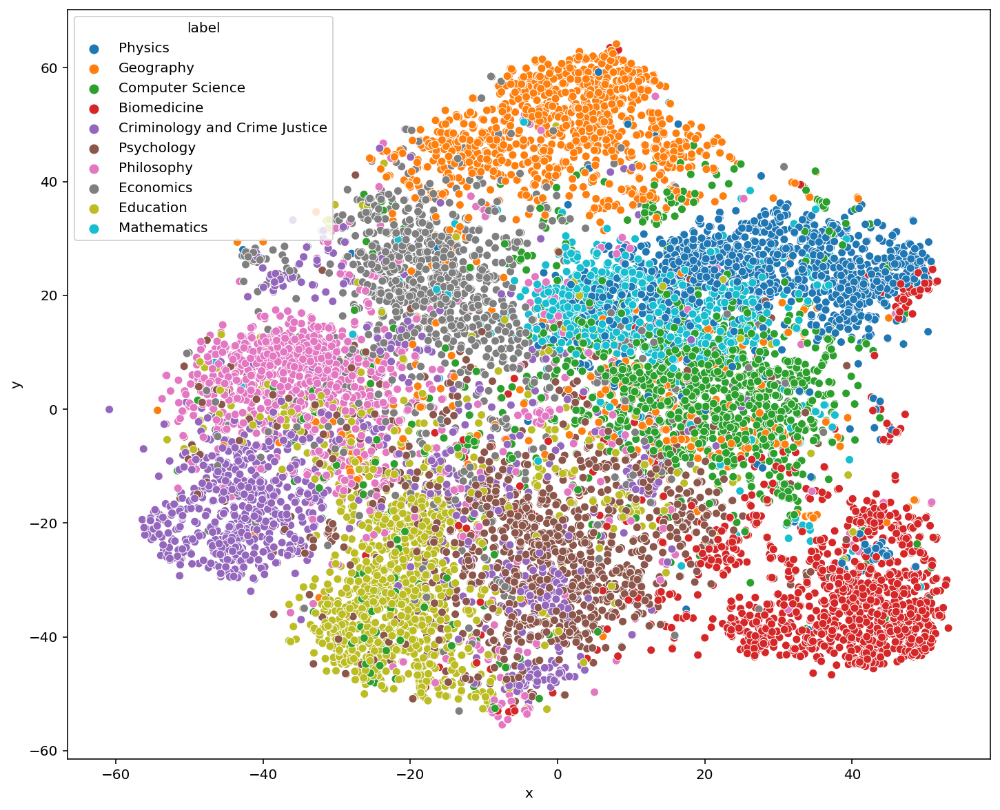

In [ ]:
cltempsum=plot2dandreturndf(tsne_cltrainsum,cl_ytrainsum)

#### 2.2.4 Titles 2D
The last approach that we have taken into account are the titles of the abstracts. The preprocess takes only names lemmatized. We have reach into an agreement so that we think that this has been the worst approach in terms of visualization. 
This may be because just few words represent well each document title and making the average and the sum it is not enough to capture the correlation between the title words and the disciplines. In summary, there is not enough strong information of word chains as occurs in abstract corpus to capture this relationship.


In [ ]:
### THIS IS THE PREPROCESSING PIPELINE WE HAVE USED TO PREPROCESS THE TITLES
nlp = spacy.load('en_core_web_md')
nlp.disable_pipe('parser')
nlp.disable_pipe('ner')
valid_POS = set(['NOUN','PROPN'])
def titles_preprocessing(rawtext):
    """
    Implements tokenization, lemmatization and stopword removal from a string
    :rawtext: Input string to preprocess
    Returns the lemmatized string where lemmas are joined with a blank space
    """
    doc = nlp(rawtext)
    lemmatized = ' '.join([token.lemma_ for token in doc if (token.is_alpha == True) and (token.pos_ in valid_POS) and (not token.is_stop)])
       
    return lemmatized
### AND THIS ITERATES BY EACH TITLE ROW AND GET THE TITLE LEMMATIZED SO THAT WE MERGE ALL IN A LIST 
### OF LIST OF TOKENS

def lemmatizedtit(data_abstracts):
      data_lemmas = []
      nprojects = len(data_abstracts)
      for n, abstract in enumerate(data_abstracts):
          if not n%100:
              print('\rPreprocessing abstract', n, 'out of', nprojects, end='', flush=True)
          data_lemmas.append(titles_preprocessing(abstract))
      return data_lemmas

In [ ]:
### WE LEMMATIZED THE TRAIN AND THE TEST
titlestrain=lemmatizedtit(x_train["Title"].to_list())
titlestest=lemmatizedtit(x_val["Title"].to_list())

Preprocessing abstract 4900 out of 4990

In [ ]:
### WE CONVERT THE LIST ONTO A PANDAS SERIES SO THAT WE KEEP TRACK OF THE INDICES 
titlestrainpd=pd.Series(titlestrain,index=x_train["Title"].index.values)
titlestestpd =pd.Series(titlestest,index=x_val["Title"].index.values)

##### MEAN APPROACH

In [ ]:
tsne_tletrain,tsne_tletest,tle_ytrain,tle_ytest=word2tsne(titlestrainpd.str.split(),titlestestpd.str.split(),y_train,y_val,n_c=2,per=35)

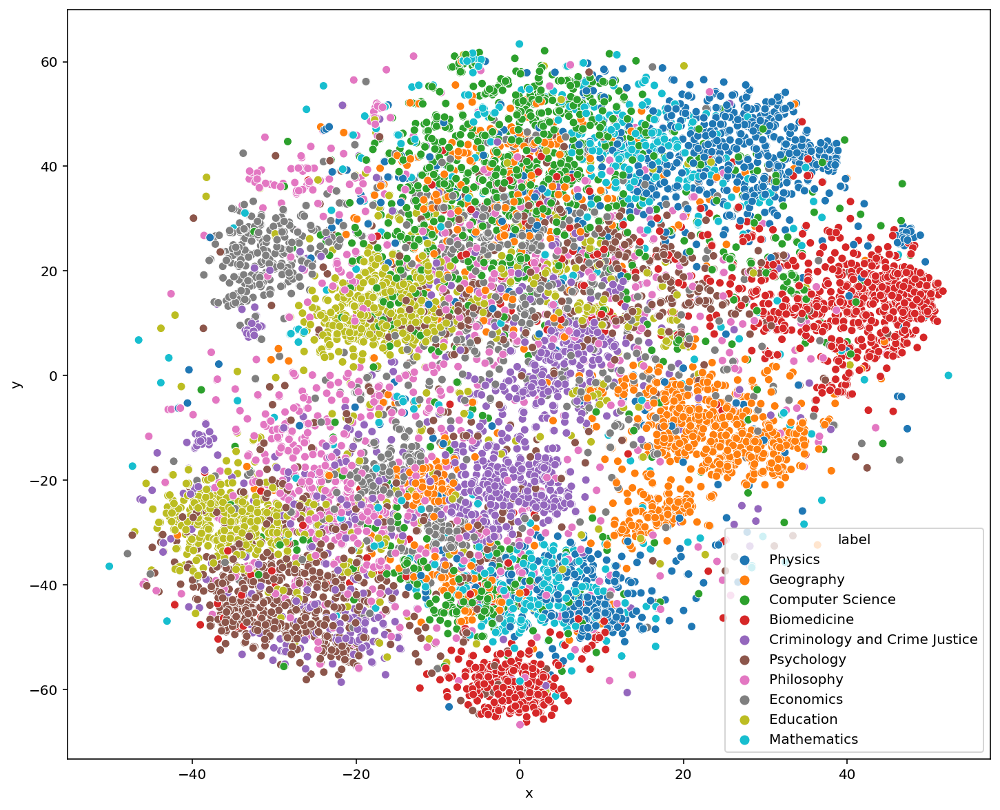

In [ ]:
ttletemp=plot2dandreturndf(tsne_tletrain,tle_ytrain)

In [ ]:
## READING TSNE TITLES FROM A PICKLE
import pickle 
with open(local_folder+ 'Task 2 CheckPoints/' +'tle2d.pickle', 'rb') as handle:
    ttle2d=pickle.load( handle)

##### SUM APPROACH

In [ ]:
tsne_tletrainsum,tsne_tletestsum,tle_ytrainsum,tle_ytestsum=word2tsnesum(titlestrainpd.str.split(),titlestestpd.str.split(),y_train,y_val,n_c=2,per=35)

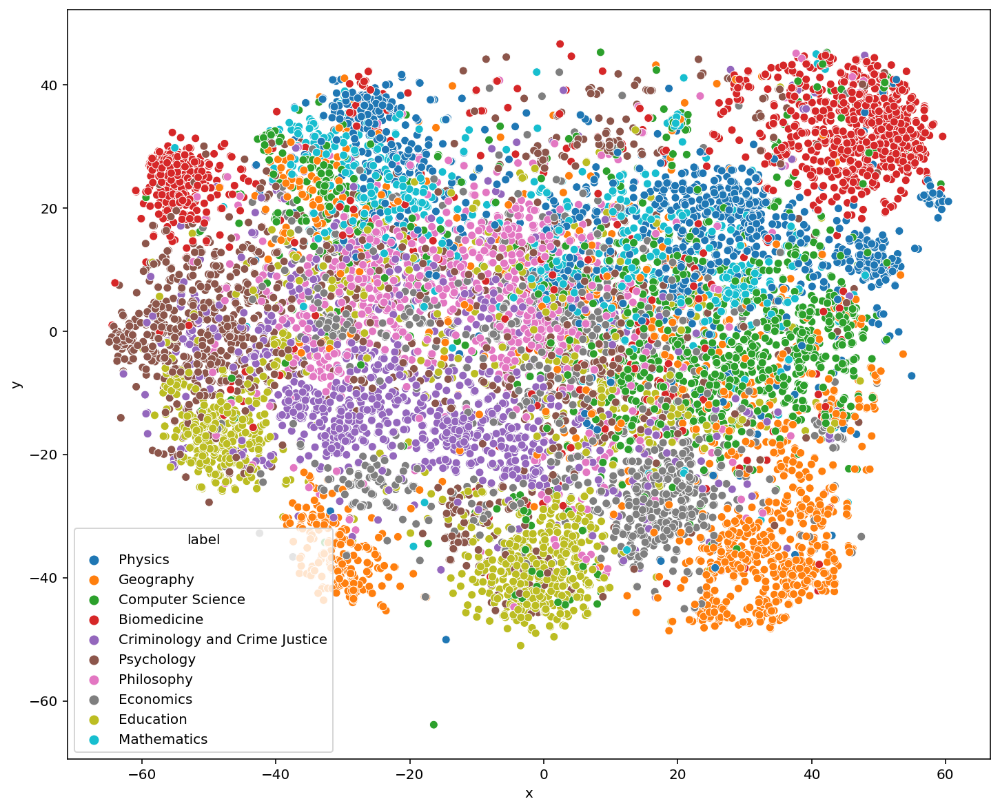

In [ ]:
ttletempsum=plot2dandreturndf(tsne_tletrainsum,tle_ytrainsum)

#### 2.2.5 Summary of Word2TSNE visualization
The summary is that the best tsne that capture the correlation is the one which is encoded with the clean lemmas. The two tsne components of the corpus are going to taken into account for the calssification task. 

### 2.3 TSNE Classification Task
Now we are going to work in the classification task part. First of all, we take into account the process that we have made above so that we take the document representation of each abstract as two new features of our dataframe.
Straightaway, we are going to consider two main approaches:
- Classification with clean lemmas representation in 2 dimensions 
- Classification of clean lemmas representaion plus certain preprocess, adding features, ...

In [ ]:
### LOADING DATA NEEDED
import pickle 
with open(local_folder+ 'Task 2 CheckPoints/'+ 'lastspring.pickle', 'rb') as handle:
    dfdict=pickle.load( handle)
import pickle 
with open(local_folder+ 'Task 2 CheckPoints/'+'cl2d.pickle', 'rb') as handle:
    clemmas2d=pickle.load(handle)

In [ ]:
from sklearn.metrics import plot_confusion_matrix
def printperformanceandconfmatrix(acc_train,acc_test,test,targettest,clf,nameclass):
        print(colored('{:>1}  {:>0} '.format("Accuracy train with : "+nameclass, str(acc_train)),'blue'))
        print(colored('{:>1}  {:>0} '.format("Accuracy test  with : "+nameclass, str(acc_test)),'red'))
    
        if isinstance(targettest,pd.core.series.Series) and isinstance(test,pd.core.frame.DataFrame):
              
            plot_confusion_matrix(clf, test.to_numpy(), targettest.to_numpy(),xticks_rotation='vertical',cmap=plt.cm.Blues)
            plt.show() 
        else:
            plot_confusion_matrix(clf, test,targettest,xticks_rotation='vertical',cmap=plt.cm.Blues)
            plt.show()

##### 2.3.1 TSNE Classification with Clean Lemmas 
This classification  approach makes use  of the two components of the TSNE representation of the abstract. There is no preprocessing stablished before applying the classification but there is a search of an optimum result. The classifiers that we have implemented are:
- SVM (Support Vector Machine)
- KNN (K Nearest Neighbours)

###### 2.3.1.1 SVM (Support Vector Machine)
We use this classification machinery to predict the disciplines of the abstracts.
1. First of all we make a first gridsearch of the optimal model fixing the kernel to an rbf and combining different gammas and C values.
2. Then we approximate to gamma and C values that are optimal  measuring the dependence between them
3. To sum up we get the best parameters which are the ones that we use to predict the test data

In [ ]:
from sklearn.svm import SVC

# SVM
### GRID SEARCH FOR DIFFERENT GAMMA AND C VALUES
svm = GridSearchCV(SVC(kernel='rbf'),{
    'gamma': [0.1,1,10],
    'C': [0.1,1,10,100,1000]
},cv = 3)

### WE FIT THE SVM GRIDSEARCH
svm.fit(clemmas2d["tsne_train"],clemmas2d["y_train"])
df = pd.DataFrame(svm.cv_results_) # Visualize in a better way the results
### AND WE GET THE BEST RESULTS 
print('SVM Results')
print(df[['param_gamma','param_C','mean_test_score']])
print('Best parameters choice:',svm.best_params_)   # Best parameters choice

SVM Results
   param_gamma param_C  mean_test_score
0          0.1     0.1         0.733551
1            1     0.1         0.231060
2           10     0.1         0.111665
3          0.1       1         0.745061
4            1       1         0.719636
5           10       1         0.515978
6          0.1      10         0.733551
7            1      10         0.676689
8           10      10         0.528776
9          0.1     100         0.702372
10           1     100         0.658049
11          10     100         0.527746
12         0.1    1000         0.671364
13           1    1000         0.654184
14          10    1000         0.528175
Best parameters choice: {'C': 1, 'gamma': 0.1}


[0.27168802 0.26911132 0.26541792 0.26430126 0.26215384 0.26060792
 0.25828862 0.25803084 0.25708591 0.25511032 0.25382206 0.2565708
 0.25614123 0.25966295 0.26163843]
Best gamma is 0.1178768635


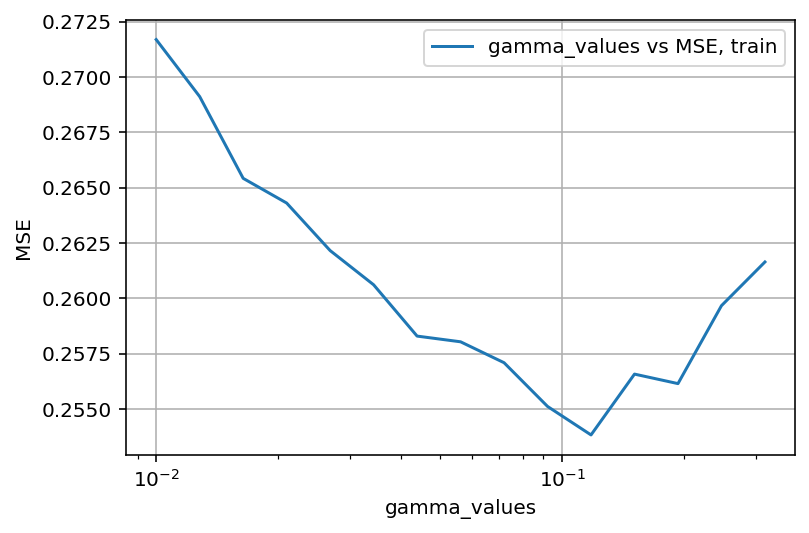

In [ ]:
### THIS FIRST VALIDATION FIXES THE C VALUE TO SEEK THE OPTIMAL GAMMA VALUE

from sklearn.model_selection import cross_validate

### WE SEEK OVER VALUES THA ARE ROUNDING THE OPTIMAL ONE THAT WE HAVE GOT IN GRIDSEARCH (0.1)
gamma_values = np.logspace(-2, -0.5, 15, endpoint=True)
counter = 0
MSESVM = np.empty(gamma_values.shape[0])
### FOR EACH GAMMA VALUE
for ii in gamma_values:
    ### WE CROSSVALIDATE 3 TIMES THE APPROACH
    prediction = cross_validate(SVC(C= 1,gamma = ii),clemmas2d["tsne_train"],clemmas2d["y_train"], cv= 3)
    ### WE MEASURE THE PERFORMANCE OBTAINING THE ERROR OF THE PREDICTION
    MSESVM[counter] = 1-(sum(prediction['test_score'])/len(prediction['test_score']))
    counter += 1   

# PLOTTING THE EVOLUTION PERFORMANCE OF GAMMA PARAMETER
plt.figure()
plt.plot(gamma_values,MSESVM, label='gamma_values vs MSE, train')
_ = plt.xlabel('gamma_values')
_ = plt.ylabel('MSE')
_ = plt.legend()
plt.grid()
plt.xscale('log')
best_parameter=np.where(MSESVM==min(MSESVM))
gamma=gamma_values[best_parameter][0]
print('Best gamma is {0:.10f}'.format(gamma))

Best C_VALUE is 0.8799225436


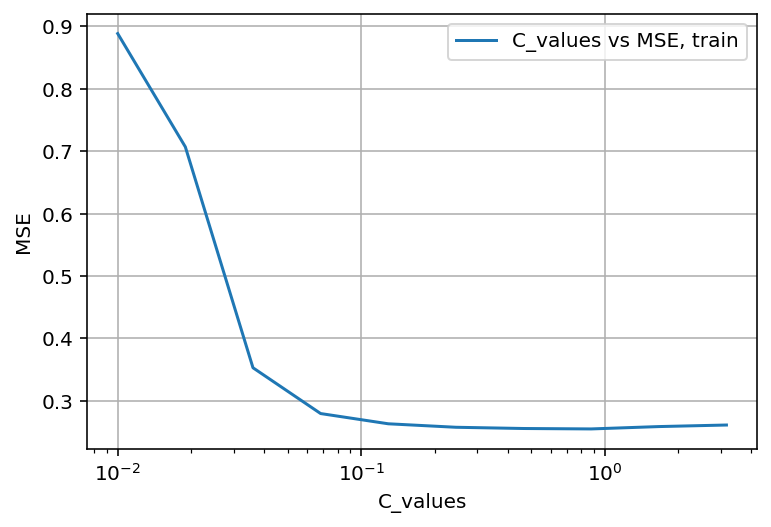

In [ ]:
### THIS SECOND VALIDATION  FIXES THE GAMMA VALUE TO SEEK THE OPTIMAL C VALUE

C_values = np.logspace(-2, 0.5,10 , endpoint=True)
counter = 0
MSE = np.empty(C_values.shape[0])

for ii in C_values:
    ### NOW WE FIXED THE OPTIMAL GAMMA VALUE GOT ABOVE AND WE MAKE CROSSVALIDATION
    ### FOR EACH C_VALUE
    prediction = cross_validate(SVC(C= ii,gamma = gamma),clemmas2d["tsne_train"],clemmas2d["y_train"], cv= 3)
     ### WE MEASURE THE PERFORMANCE OBTAINING THE ERROR OF THE PREDICTION
    MSE[counter] = 1-(sum(prediction['test_score'])/len(prediction['test_score']))
    counter += 1   
  
best_Cvalue=np.where(MSE==min(MSE))
C_value=C_values[best_Cvalue][0]
# PLOT
plt.figure()
plt.plot(C_values,MSE, label='C_values vs MSE, train')
_ = plt.xlabel('C_values')
_ = plt.ylabel('MSE')
_ = plt.legend()
plt.grid()
plt.xscale('log')
print('Best C_VALUE is {0:.10f}'.format(C_value))


**Optimal parameters**
<br>
Gamma: 0.1178768635
C    : 0.8799225436

In [ ]:
from sklearn.model_selection import GridSearchCV
### SVM FUNCTION TO PREDICT THE TEST
def SVM(gamma,C,kernel,clemmas2d):
    svc=SVC(C=C,kernel=kernel,gamma=gamma)
    svc.fit(clemmas2d["tsne_train"],clemmas2d["y_train"])
    y_pred=svc.predict(clemmas2d["tsne_test"])
    y_pred_train=svc.predict(clemmas2d["tsne_train"])
    acc_test=(y_pred==clemmas2d["y_test"].values).tolist().count(True)/(len(clemmas2d["y_test"]))
    acc_train=(y_pred_train==clemmas2d["y_train"].values).tolist().count(True)/(len(clemmas2d["y_train"]))
    
    return [acc_train,acc_test,clemmas2d["tsne_test"],clemmas2d["y_test"].values,svc,"SVC"]

In [ ]:
gamma= 0.1178768635; C=0.8799225436
[acc_train,acc_test,test,targettest,clf,name]=SVM(gamma,C,"rbf",clemmas2d=clemmas2d)


Accuracy train with : SVC  0.7732348393746779 
Accuracy test  with : SVC  0.7450901803607214 


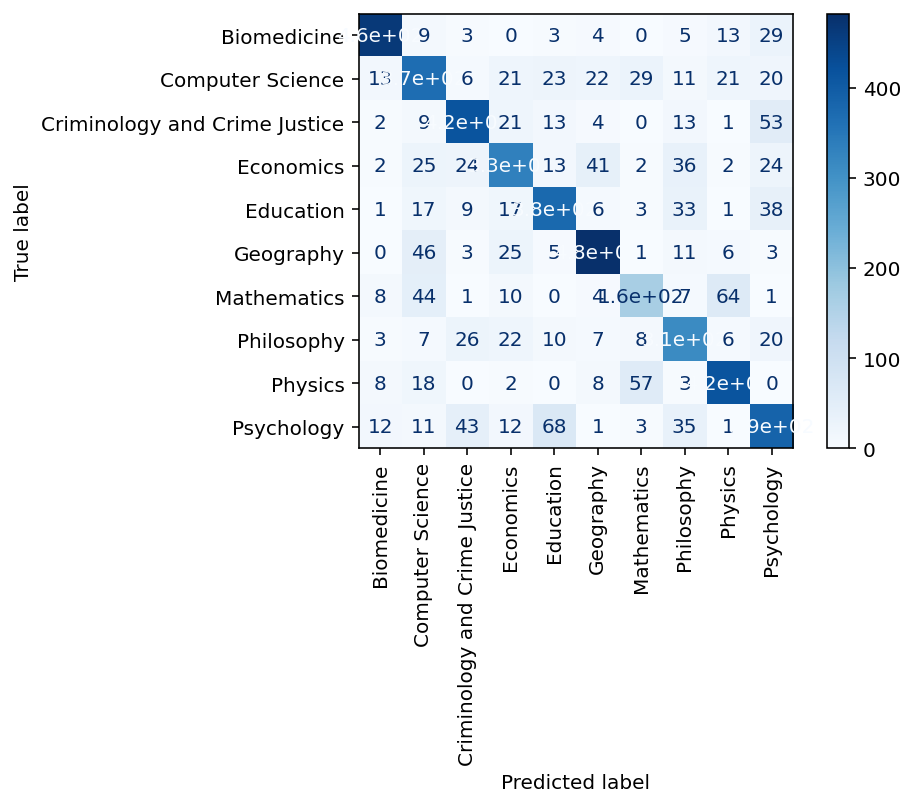

In [ ]:
printperformanceandconfmatrix(acc_train,acc_test,test,targettest,clf,name)

###### 2.3.1.2 KNN (K Nearest Neighbours)
This second approach has just been cros validated with the different parameters of the model. There is no study of any dependency of one parameter respect to other ones

In [ ]:
### I convert train and test target onto numerical values so that give the possibility that KNN understands the classes
targettrain=clemmas2d["y_train"].astype("category")
targettest=clemmas2d["y_test"].astype("category")

In [ ]:
### KNN CLASSICAL APPROACH
### Grid Search of the KNN APPROACH
knn = GridSearchCV(KNeighborsClassifier(),{
    'n_neighbors': np.arange(20,80,20),
    'weights':['uniform','distance'],
    'metric':['euclidean','manhattan','minkowski','chebyshev','cosine','canberra']
},cv = 5,refit=True)
knn.fit(clemmas2d["tsne_train"],targettrain.cat.codes)
dfKNN = pd.DataFrame(knn.cv_results_) # Visualize in a better way the results

# Summary table 
print('KNN Results')
print('Best parameters choice:',knn.best_params_)   # Best parameters choice
print("KNN_best score: ",knn.best_score_)

KNN Results
Best parameters choice: {'metric': 'chebyshev', 'n_neighbors': 40, 'weights': 'distance'}
KNN_best score:  0.7512455384742504


Accuracy train with : KNN  1.0 
Accuracy test  with : KNN  0.7501002004008016 


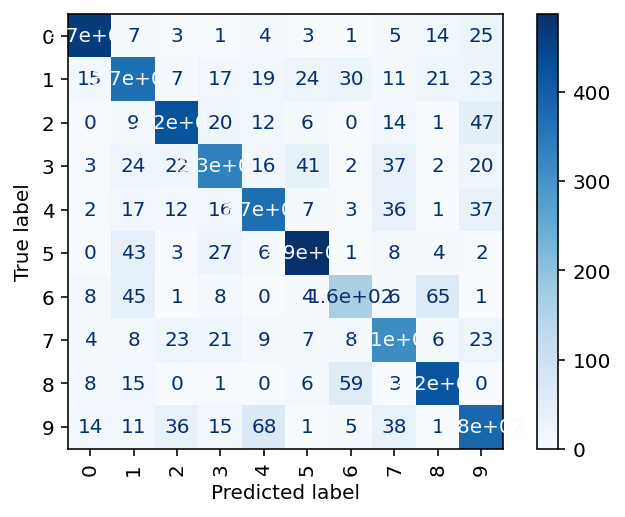

In [ ]:
### PREDICTION
y_pred_train=knn.predict(clemmas2d["tsne_train"])
y_pred_test=knn.predict(clemmas2d["tsne_test"])
acc_train=(y_pred_train==targettrain.cat.codes).tolist().count(True)/(len(clemmas2d["y_train"]))
acc_test=(y_pred_test==targettest.cat.codes).tolist().count(True)/(len(clemmas2d["y_test"]))
### CONFUSION MATRIX AND ACCURACIES
printperformanceandconfmatrix(acc_train,acc_test,clemmas2d["tsne_test"],targettest.cat.codes.to_numpy(),nbrs,"KNN")

##### 2.3.2 TSNE Classification with Lemmas + Preprocessing
Even though we have used the tsne representations of the model  to classify, we have not taken into account in merging tsne representations with other variables of the dataframe or doing a certain preprocessing before going to the prediction task. This section is about this and we are going to implement several cleaning and selection techniques before applying classification models.



In [ ]:
#### IMPORTING PICKLES 
import pickle 
with open(local_folder+ 'Task 2 CheckPoints/'+'lastspring.pickle', 'rb') as handle:
    dfdict=pickle.load( handle)
import pickle 
with open(local_folder+ 'Task 2 CheckPoints/'+'cl2d.pickle', 'rb') as handle:
    clemmas2d=pickle.load(handle)

In [ ]:
disc_dict={'Economics':0,'Criminology and Crime Justice': 1,'Economics 2':0, 'Psychology': 2,'Physics':3,'Mathematics': 4,
           'Geography': 5,'Psychology 2': 2, 'Philosophy': 6,'Biomedicine': 7,'Education':8,'Garbage':10,'Physics 2':3,'Computer Science': 9,'Geography 2': 5 }
def tonum(maxdisc):
  return disc_dict[maxdisc]

###### 2.3.2.1 Adding features to TSNE 2D Components
What we make in this pipeline is as simple as adding some features of the metadata to our train model.
- Accesses: number of times that user has accesed to this document
- N_lemmas: length of each document
- Num_Topic: this feature is the most likely topic that LDA has assigned to a certain document
- Year   : age of the publication 


In [ ]:
def preselection(dfdict,clemmas2d):
    ### We have to take into account that the topics generated was 10 but labeled in 15
    ### Biomedicine 2, Phylosophy 2 ... is replaced by Phylosophy,Biomedicine, etc

    # I convert all the variables that are biomedicine 2 , phylosophy 2 to phylosophy, biomedicine
    dfdict["train"]["num_topic"]=dfdict["train"]['main_topic_15'].apply(lambda x: tonum(x))
    dfdict["val"]["num_topic"]=dfdict["val"]['main_topic_15'].apply(lambda x: tonum(x))
    
    # I convert this categorical variables to discrete ones 
    # # I add the x and y component of TSNE to the train and the test data
    dfdict["val"]["x_c"]=clemmas2d["tsne_test"][:,0].tolist()
    dfdict["val"]["y_c"]=clemmas2d["tsne_test"][:,1].tolist()
    dfdict["train"]["x_c"]=clemmas2d["tsne_train"][:,0].tolist()
    dfdict["train"]["y_c"]=clemmas2d["tsne_train"][:,1].tolist()

    # I convert the most likely topic of each document to a discipline which is discretized by a number
    index_train=dfdict["train"]["num_topic"].loc[dfdict["train"]["num_topic"]==9].index.values
    index_test=dfdict["val"]["num_topic"].loc[dfdict["val"]["num_topic"]==9].index.values

    # I drop all the rows that as been classified by the LDA as "garbage topic"
    # the reason wh we remove is because we delete it
    dfdict["train"].drop(index=index_train,inplace=True)
    dfdict["val"].drop(index=index_test,inplace=True)
    dfdict["ytrain"].drop(index=index_train,inplace=True)
    dfdict["yval"].drop(index=index_test,inplace=True)
    #  We use just numeric variables
    v_num= [element for element in dfdict["train"].dtypes[(dfdict["train"].dtypes!='O')].index.values if element != 'target']
    return dfdict,v_num

In [ ]:
dfpreselected,features=preselection(dfdict,clemmas2d)

###### 2.3.2.2 Scaling Features
We can see that features have different ranges and for that reason we scale the data train onto the mean of the total data and also for the variance.



In [ ]:
dfpreselected["train"].describe()

,Year,Accesses,nlemmas,num_topic,x_c,y_c
count,10148.000000,10148.000000,10148.000000,10148.000000,10148.000000,10148.000000
mean,2019.680922,465.161510,85.717875,4.480587,-0.312910,0.006382
std,1.106207,1604.768848,28.326608,2.533216,26.030799,28.953935
min,2014.000000,0.000000,40.000000,0.000000,-55.094936,-62.193634
25%,2019.000000,52.000000,64.000000,2.000000,-21.587618,-23.432683
50%,2020.000000,143.000000,82.000000,4.000000,1.453743,-0.493506
75%,2020.000000,372.000000,103.000000,7.000000,16.732471,22.939104
max,2021.000000,81000.000000,239.000000,10.000000,56.731258,61.229523


In [ ]:
### The year and num of topic are not scaled because are discrete variables
not_scaled=[features.pop(0),features.pop(2)]

In [ ]:
### We scale just numeric variables
features

['Accesses', 'nlemmas', 'x_c', 'y_c']

In [ ]:
### Numerical Values Scaled
sc_train,sc_val=scalingdata(dfpreselected["train"][features],dfpreselected["val"][features])

###### 2.3.2.3 Transformation of variables  (Acceses)
We are going to see what occurs if we transform each feature by a normal distribution:

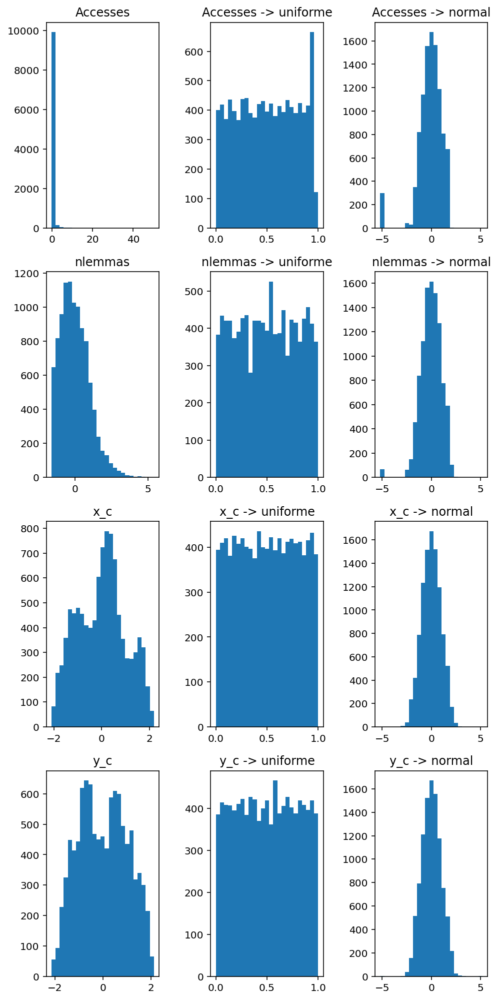

In [ ]:
from sklearn.preprocessing import quantile_transform
### CODE TO TRANSFORM FEATURES GOT FROM LAB 2
ndim = len(features)
fx, ax = plt.subplots(ndim, 3, figsize=(7,14))
nbins = 25
for jj in range(len(features)):
  xjj = sc_train[:,jj]
  # IF THE SET OF THE TOTAL ELEMENTS IS GREATER THAN THE NUMBER OF BINS REQUIRED 
  # WE DO NOT APPLY THE TRANSFORMATION
  
  if len(np.unique(xjj)) < nbins:
    continue
  ax[jj][0].hist(xjj,nbins)
  ax[jj][0].set_title('{0}'.format(features[jj]))
  xjj_u = quantile_transform(xjj.reshape(-1,1), n_quantiles=nbins, random_state=42, copy=True)
  ax[jj][1].hist(xjj_u, nbins)
  ax[jj][1].set_title('{0} -> uniforme'.format(features[jj]))
  xjj_n = quantile_transform(xjj.reshape(-1,1), n_quantiles=nbins, random_state=42, copy=True, output_distribution='normal')
  ax[jj][2].hist(xjj_n, nbins)
  ax[jj][2].set_title('{0} -> normal'.format(features[jj]))
fx.tight_layout()

We have realized that the number of accesses will be convenient to transform to a uniform distribution because it represents better the number of variables

In [ ]:
import numpy as np
from sklearn.preprocessing import QuantileTransformer
# WE CALL TO THE QUANTILE TRANSFORMER AND WE MAP ALL THE VARIABLES ONTO A UNIFORM DIDSTRIBUTION
qt = QuantileTransformer(n_quantiles=25,output_distribution="uniform")
# WE TRANSFORM THE NUMERICAL VARIABLES
normal_features=qt.fit_transform(sc_train)
validation_features=qt.fit_transform(sc_val)


In [ ]:
## AND WE WANT THE FIRST COLUMN OF THE FATURES WHICH IS ACCES AND ADD TO THE SCALED TRAIN AND TEST
sc_train=np.hstack((normal_features[:,0].reshape(-1,1),sc_train[:,1:]))
sc_val=np.hstack((validation_features[:,0].reshape(-1,1),sc_val[:,1:]))

We discard the year because we may think that it was not a relevant feature

In [ ]:
trainnormal= pd.DataFrame(np.hstack((sc_train,dfpreselected["train"]["num_topic"].to_numpy().reshape(-1,1))), columns = features+["num_topic"])
valnormal= pd.DataFrame(np.hstack((sc_val,dfpreselected["val"]["num_topic"].to_numpy().reshape(-1,1))), columns =  features+["num_topic"])

###### 2.3.2.4 MRMR (Multivariate Relevance Criteria Information)
In this step we have based mutual information in a multivariate way to take into account the redundancy between variables (correlation). We have taken this code from lab 2 (Feature Selection) and the results are intersting.
We can see that num_topic has not as relevance for multivariate. That may be because even though the attribute were relevant, the reduncdance that produces with other input variables makes worse feature.
The most relevant variable are the ones more related with the target (accesses, components of the TSNE) 

In [ ]:
from sklearn.feature_selection import mutual_info_classif
def MRmr(trainnormal,features):
            ### WARNING!!! THIS FUNCTION IS IMPLEMENTED BY VANESSA INSIDE THE 4 LABORATORY PART 
            # Variable initialization
            n_var = len(features)
            var_sel = np.empty(0,dtype=int) # subset of selected features
            var_cand = np.arange(n_var) # subset of candidate features

            # Precompute relevances 
            relevances = mutual_info_classif(trainnormal.iloc[:,:-1], trainnormal["target"], discrete_features=discrete_features)

            # Precomupute redundancies (correlation among all input variables, it is a matrix of n_var x n_var)
            redundancies = np.abs(np.cov(trainnormal.iloc[:,:-1].T))

            # Select the most relevant feature
            sel = np.argmax(relevances)
            # Add it to the subset of selected features
            var_sel = np.hstack([var_sel,sel])
            # Remove it from the subset of candidate features
            var_cand = np.delete(var_cand,sel)

            MRmr_values= [relevances[sel]]

            # Iteratively select variables
            for i in range(n_var-1):
                # Get relevance values of the var_cand variables
                relevances_cand=relevances[var_cand]
                
                # Compute redundancies with selected features:
                # from the redundancies matrix select the rows of var_sel and the columns of var_cand
                redundancy_sel = redundancies[np.ix_(var_sel,var_cand)]    
                # Average the redundancy values over the selected features (rows) 
                # to get a redundancy value for each candidate variables   
                redundancy_cand=np.mean(redundancy_sel,axis=0)
                
                # Compute MRmr = relevances_cand - redundancy_cand
                MRmr=relevances_cand-redundancy_cand
                
                # Select the new feature as the one with the maximum MRmr value
                sel=np.argmax(MRmr)
                MRmr_values.append(MRmr[sel])
                # Add it to the subset of selected features
                var_sel=np.hstack([var_sel,var_cand[sel]])
                # Remove it from the subset of candidate features
                var_cand= np.delete(var_cand,sel)

            ind_rel_feat = var_sel
            mi_scores_MRmr = pd.Series(MRmr_values, index =np.array(features)[ind_rel_feat]) 
            return mi_scores_MRmr



In [ ]:
# We append to the features list the num_topic feature
features.append("num_topic")

In [ ]:

trainnormal["target"]=dfpreselected["ytrain"].to_numpy()
valnormal["target"]=dfpreselected["yval"].to_numpy()
## We convert to a discrete variable so that Mrmr recognizes that this variable
## is discrete type
trainnormal["num_topic"]=trainnormal["num_topic"].astype(int)
valnormal["num_topic"]=valnormal["num_topic"].astype(int)

discrete_features = trainnormal.iloc[:,:-1].dtypes == int

## We apply forward search Multivariate Relevance Criteria Information
mi_scores_MRmr=MRmr(trainnormal,features)
mi_scores_MRmr

y_c          0.847182
x_c          0.669777
Accesses     0.115216
nlemmas      0.048801
num_topic   -0.007262
dtype: float64

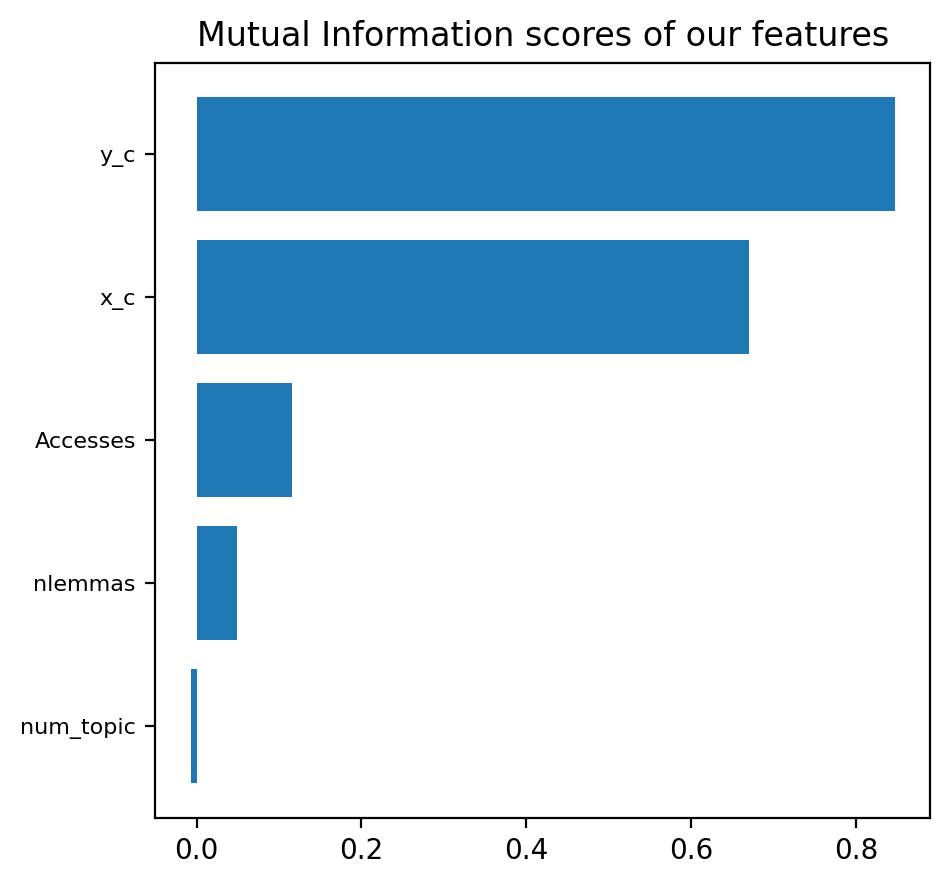

In [ ]:
def plot_utility_scores(scores, title):
    y = scores.sort_values(ascending=True)
    width = np.arange(len(y))
    ticks = list(y.index)
    plt.barh(width, y)
    plt.yticks(width, ticks)
    plt.title(title)
plt.figure(dpi=100, figsize=(5, 5))
plt.rc('ytick', labelsize=8) 
plot_utility_scores(mi_scores_MRmr, title="Mutual Information scores of our features")


In [ ]:
trainnormal.columns

Index(['Accesses', 'nlemmas', 'x_c', 'y_c', 'num_topic', 'target'], dtype='object')

###### 2.3.2.5 GMM (Gaussian Mixture Model)
In this step we have applied this technique to remove the outliers by discipline distribution. 

In [ ]:
### WE CATEGORIZE THE TARGETS
ytrain=trainnormal.target.astype('category')
yval=valnormal.target.astype('category')

In [ ]:
## What we need in this piece of code is getting the mean vector of each discipline
## so that when GMM is initialized, the algorithm identify the centroids as best as possible
classes=np.unique(ytrain.cat.codes.to_numpy())
## We put 4 that refers to the number of features we use (acceses(uniformed),x_c,y_c,num_topic)
mean_scores=np.zeros((len(classes),4))
for i in range(len(classes)):
    mean_scores[i,:]=np.mean(trainnormal.iloc[np.where(ytrain.cat.codes.to_numpy()==i)[0],[0,1,2,3]],axis=0)


In [ ]:
from sklearn.mixture import GaussianMixture
##GAUSSIAN MIXTURE MODEL 
# As we know the dataset, we set K=10 (otherwise this parameters has to be selected)
gmm = GaussianMixture(n_components=10,covariance_type='full',n_init=200,means_init=mean_scores) 
gmm.fit(trainnormal.iloc[:,[0,1,2,3]]) 
### We get the logs probabilities and the outiers that the algorithm identifies
log_probs = gmm.score_samples(trainnormal.iloc[:,[0,1,2,3]])
y_outlier_pred = np.zeros([trainnormal.iloc[:,[0,1,2,3]].shape[0],])

###### 2.3.2.6 Classification Task
This part we combine the gridsearch of the optimum contamination fraction of the GMM with the classifier is implemented.
Remember that how we have removed Year and num_topics does not guarantee too much Mutual Information the definitive features that we use are Accesses, x_c,y_c and num_lemmas.

KNN GRIDSEARCH AND RESULTS

In [ ]:
frac_values=[0.,0.05,0.1]
for frac in frac_values:

    ## DETECT OUTLIERS
    idx_outliers = np.argsort(log_probs)[:int(np.round(trainnormal.iloc[:,[0,1,2,3]].shape[0]*frac))]
    traininlied=np.delete(trainnormal.iloc[:,[0,1,2,3]].to_numpy(), idx_outliers, axis=0)
    yinlied=np.delete(ytrain.cat.codes.to_numpy(), idx_outliers, axis=0)
    
    # # KNN CLASSICAL APPROACH
    knntsne = GridSearchCV(KNeighborsClassifier(),{
        'n_neighbors': np.arange(10,100,10),
        'weights':['uniform','distance'],
        'metric':['euclidean','manhattan','minkowski','chebyshev','cosine','canberra']
    },cv = 3)
    knntsne.fit(traininlied,yinlied)
    dfKNN = pd.DataFrame(knntsne.cv_results_) # Visualize in a better way the results

    # Summary table 
    print('Contamination data',frac)
    print('KNN Results')
    print('Best parameters choice:',knntsne.best_params_)   # Best parameters choice
    print("KNN_best score: ",knntsne.best_score_)


Contamination data 0.0
KNN Results
Best parameters choice: {'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}
KNN_best score:  0.7269413707374549
Contamination data 0.05
KNN Results
Best parameters choice: {'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}
KNN_best score:  0.7322895094104386
Contamination data 0.1
KNN Results
Best parameters choice: {'metric': 'manhattan', 'n_neighbors': 40, 'weights': 'distance'}
KNN_best score:  0.7374349353075168


In [ ]:
### SELECTION OF CONTAMINATION TRAIN DATA THAT WE REMOVE
frac = 0.1# We set the number of contaminated data
idx_outliers = np.argsort(log_probs)[:int(np.round(trainnormal.iloc[:,[0,1,2,3]].shape[0]*frac))]
traininlied=np.delete(trainnormal.iloc[:,[0,1,2,3]].to_numpy(), idx_outliers, axis=0)
yinlied=np.delete(ytrain.cat.codes.to_numpy(), idx_outliers, axis=0)

In [ ]:
### PREDICTION
from sklearn.neighbors import KNeighborsClassifier
nbrs = KNeighborsClassifier(n_neighbors=40,weights="distance",metric='manhattan')
nbrs.fit(traininlied,yinlied)
y_pred_train=nbrs.predict(traininlied)
y_pred_test=nbrs.predict(valnormal.iloc[:,[0,1,2,3]].to_numpy())
acc_train=(y_pred_train==yinlied).tolist().count(True)/len(yinlied)
acc_test=(y_pred_test==yval.cat.codes.to_numpy()).tolist().count(True)/len(y_pred_test)

In [ ]:
from sklearn.metrics import plot_confusion_matrix
def printperformanceandconfmatrix(acc_train,acc_test,test,targettest,clf,nameclass):
        print(colored('{:>1}  {:>0} '.format("Accuracy train with : "+nameclass, str(acc_train)),'blue'))
        print(colored('{:>1}  {:>0} '.format("Accuracy test  with : "+nameclass, str(acc_test)),'red'))
    
        if isinstance(targettest,pd.core.series.Series) and isinstance(test,pd.core.frame.DataFrame):
              
            plot_confusion_matrix(clf, test.to_numpy(), targettest.to_numpy(),xticks_rotation='vertical',cmap=plt.cm.Blues)
            plt.show() 
        else:
            plot_confusion_matrix(clf, test,targettest,xticks_rotation='vertical',cmap=plt.cm.Blues)
            plt.show()

Accuracy train with : KNN  1.0 
Accuracy test  with : KNN  0.7259515570934256 


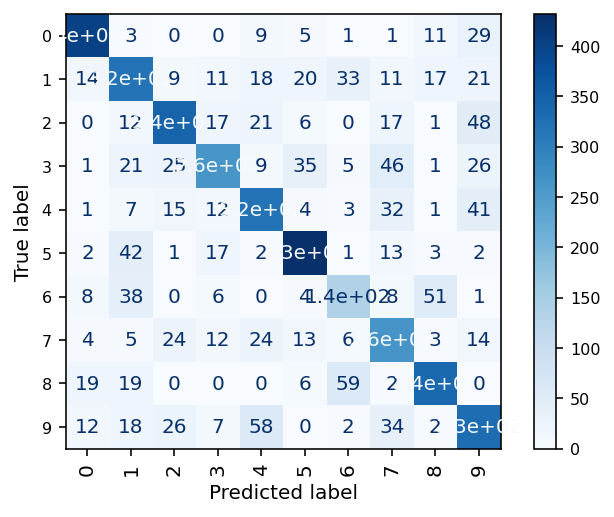

In [ ]:
### ACCURACY AND RESULTS
printperformanceandconfmatrix(acc_train,acc_test, valnormal.iloc[:,[0,1,2,3]], yval.cat.codes,nbrs,"KNN")

SVM GRIDSEARCH AND RESULTS

In [ ]:
for frac in frac_values:
       
      ## DETECT OUTLIERS
      idx_outliers = np.argsort(log_probs)[:int(np.round(trainnormal.iloc[:,[0,1,2,3]].shape[0]*frac))]
      traininlied=np.delete(trainnormal.iloc[:,[0,1,2,3]].to_numpy(), idx_outliers, axis=0)
      yinlied=np.delete(ytrain.cat.codes.to_numpy(), idx_outliers, axis=0)

      # # KNN CLASSICAL APPROACH
      svmallfeatures = GridSearchCV(SVC(),{
        
          'C': [0.1,1,10],
          'gamma':[0.1,1,10,'auto'],
          'kernel':["rbf","linear","sigmoid"]
          
      },cv = 3)
      svmallfeatures.fit(traininlied,yinlied)
      dfSVM = pd.DataFrame(svmallfeatures.cv_results_) # Visualize in a better way the results

      # Summary table 
      print('SVM Results')
      print('Best parameters choice:',svmallfeatures.best_params_)   # Best parameters choice
      print("SVM_best score: ",svmallfeatures.best_score_)
      print('Contamination',frac)


SVM Results
Best parameters choice: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
SVM_best score:  0.7295032868916654
Contamination 0.0
SVM Results
Best parameters choice: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
SVM_best score:  0.7346748420726238
Contamination 0.05
SVM Results
Best parameters choice: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
SVM_best score:  0.7395154590904286
Contamination 0.1


In [ ]:
frac = 0.05# We set the number of contaminated data
idx_outliers = np.argsort(log_probs)[:int(np.round(trainnormal.iloc[:,[0,1,2,3]].shape[0]*frac))]
traininlied=np.delete(trainnormal.iloc[:,[0,1,2,3]].to_numpy(), idx_outliers, axis=0)
yinlied=np.delete(ytrain.cat.codes.to_numpy(), idx_outliers, axis=0)

In [ ]:
svm = SVC(kernel='rbf',C=1,gamma=10)
svm.fit(traininlied,yinlied)
y_pred_trainsvm=svm.predict(traininlied)
y_pred_testsvm=svm.predict(valnormal.iloc[:,[0,1,2,3]].to_numpy())
acc_trainSVM=(y_pred_trainsvm==yinlied).tolist().count(True)/len(yinlied)
acc_testSVM=(y_pred_testsvm==yval.cat.codes.to_numpy()).tolist().count(True)/len(y_pred_testsvm)

Accuracy train with : SVM  0.8062441655429935 
Accuracy test  with : SVM  0.714878892733564 


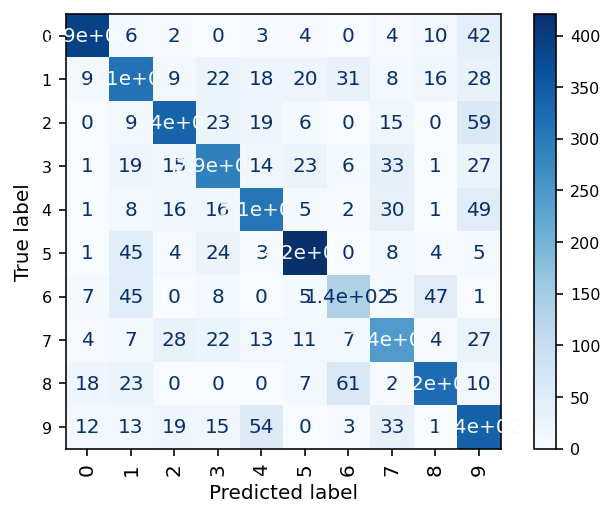

In [ ]:
printperformanceandconfmatrix(acc_trainSVM,acc_testSVM, valnormal.iloc[:,[0,1,2,3]],yval.cat.codes,svm,"SVM")

###### 2.3.2.7 Summary of the second classification
We realize that adding this new parameters besides the removinf of outlier contamination affects worse to the classification. Therefore we conclude that the best classification is made with the original two components of the TSNE representation

## 3.Word2vec + FDA (Fisher Discriminant Analysis)
This second approach is planified since the output of word2vec gives us 300 vectors. We still think that there are too much features to classify and for that reason we reduce the spatial dimension to certain number of components that we evaluate as well as we try to maximize the separation between classes with FDA that in scklearn is LDA (Multilinear Discriminant Analysis). It is a simple and an intelligent pipe to follow, reduce the dimensions and maximize the separation between classes,  and putting the final touches to the project.

In [ ]:
def word2vec(corpustrain,corpustest,y_train,y_test):
  ### CONVERT DOCUMENTS TO VEC BY THE AVERAGE MEAN OFABSTRACT WORDS
  train=corpustrain.apply(doc2vec)
  test=corpustest.apply(doc2vec)
  ### REMOVE ALL NONE VALUES 
  train.dropna(axis=0,inplace=True)
  test.dropna(axis=0,inplace=True)

  
  ### UPDATE THE TARGET VALUES

  y_train=y_train[train.index.values]
  y_test=y_test[test.index.values]

  ### CONVERT PD SERIES TO NUMPY FOR SCALING COMPUTATION
  arraytrain=np.array(train.to_list())
  arraytest=np.array(test.to_list())
  
  ### SCALE THE DATA
  sc_train,sc_test=scalingdata(arraytrain,arraytest)


  return arraytrain,arraytest,sc_train,sc_test,y_train,y_test

In [ ]:
df_spring = pd.read_excel(local_folder + 'Task 2 CheckPoints/'  + 'spring_df_15topics.xlsx')
df_spring["Keywords"]=df_spring["Keywords"].apply(tolist)
df_spring["clean_lemmas"]=df_spring["clean_lemmas"].str.split().to_list()
data=df_spring.drop(["target"],axis=1)


In [ ]:
x_train, x_val, y_train, y_val = train_test_split(data, df_spring["target"], test_size=0.3, random_state=42)

In [ ]:
arraytrain,arraytest,sc_train,sc_test,y_train,y_test=word2vec(x_train["clean_lemmas"],x_val["clean_lemmas"],y_train,y_val)

We want to retain all the components because as much variance we retain the FDA will better capture correlation between variables. However it is possible that some components were redundant in the sense that they are not need for capturing the relation that the input variables has with the target, because this information is already saved in other components.

### 3.2 FDA (Fisher Discriminant analysis)
This technique is commonly used not only to reduce the spatial dimensions, but also to maximize the separation between classes that it is what we are looking for. Therefore the number of features that we have at the end is nine which is equal to the total number of disciplines minus 1. We do not have made a PCA before because we consider that the input variables do not have too much correlation between them. 

In [ ]:
Y_train=y_train.astype("category").cat.codes.astype("int")
Y_test=y_test.astype("category").cat.codes.astype("int")

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
setdisciplines=set(Y_train)
N_feat_max = len(setdisciplines)-1 # As many new features as classes minus 1
# FISHER DISCRIMINANT ANALYSIS
lda = LinearDiscriminantAnalysis(n_components=N_feat_max)
lda.fit(sc_train, Y_train)
P_train_lda = lda.transform(sc_train)
P_test_lda = lda.transform(sc_test)

### 3.3 Evaluation of classifiers
In this section we are going to evaluate several classifiers  according to the corresponding parameters of each classifier.

#### 3.3.1 KNN (K - Nearest Neighbours)
The approach is very simple, based on a GridSearch between paramters and taking the best model (refit=True) , and predicting the test data.

In [ ]:
### EVALUATION OF KNN WITH FISHER
knnFDA = GridSearchCV(KNeighborsClassifier(weights="distance"),{
        'n_neighbors': np.arange(60,80,20),
        'metric':['euclidean','manhattan','minkowski','chebyshev','cosine','canberra'] },cv = 5,refit=True)
knnFDA.fit(P_train_lda,Y_train)
dfKNN = pd.DataFrame(knnFDA.cv_results_) # Visualize in a better way the results
print("KNN_best parameters: ",knnFDA.best_params_)
print("KNN_best score: ",knnFDA.best_score_)

KNN_best parameters:  {'metric': 'euclidean', 'n_neighbors': 60}
KNN_best score:  0.811630067031704


In [ ]:
### PREDICTION TASK
y_pred_train=knnFDA.predict(P_train_lda)
y_pred_test=knnFDA.predict(P_test_lda)
acc_trainKNN=(y_pred_train==Y_train).tolist().count(True)/len(Y_train)
acc_testKNN=(y_pred_test==Y_test).tolist().count(True)/len(Y_test)


Accuracy train with : KNN  1.0 
Accuracy test  with : KNN  0.7963927855711422 


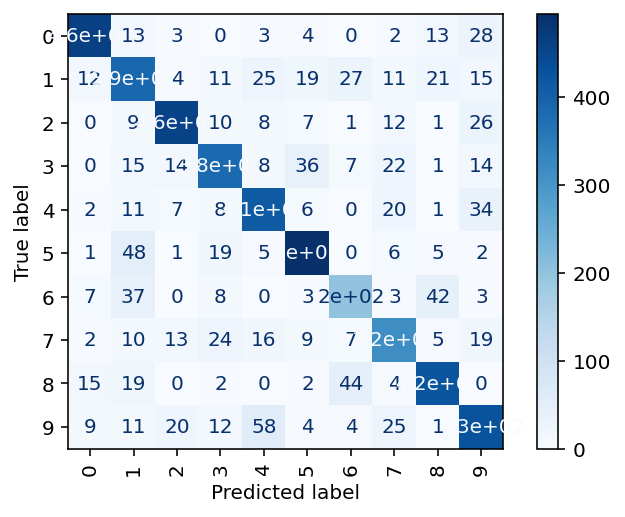

In [ ]:
### INFORMATION PERFORMANCE
printperformanceandconfmatrix(acc_trainKNN,acc_testKNN,P_test_lda,Y_test,knnFDA,"KNN")

#### 3.3.2 SVM (Support Vector Machine)
We again follow the mechanical procedure that we have done in the above approach. Validating the best parameters, taking the best model (refit=True), and classify test data.

In [ ]:
### EVALUATION OF THE SUPPORT VECTOR MACHINE TASK
from sklearn import svm
from sklearn.model_selection import GridSearchCV
svmFDA = GridSearchCV(SVC(),{
    
      'C': [0.1,1,10],
      'gamma':[0.1,1,10,'auto'],
      'kernel':["rbf","linear","sigmoid"]
      
  },cv = 3,refit=True)
svmFDA.fit(P_train_lda,Y_train)
dfSVM = pd.DataFrame(svmFDA.cv_results_) # Visualize in a better way the results
print("SVM_best parameters: ",svmFDA.best_params_)
print("SVM_best score: ",svmFDA.best_score_)



SVM_best parameters:  {'C': 10, 'gamma': 0.1, 'kernel': 'linear'}
SVM_best score:  0.8112005488010583


Accuracy train with : SVM  0.8149802439443394 
Accuracy test  with : SVM  0.7935871743486974 


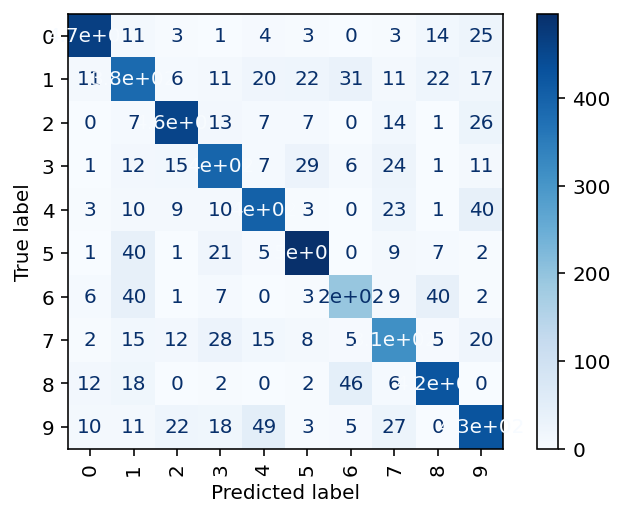

In [ ]:
### PREDICTION 
y_pred_trainSVM=svmFDA.predict(P_train_lda)
y_pred_testSVM=svmFDA.predict(P_test_lda)
acc_trainSVM=(y_pred_trainSVM==Y_train).tolist().count(True)/len(Y_train)
acc_testSVM=(y_pred_testSVM==Y_test).tolist().count(True)/len(Y_test)
### INFORMATION ABOUT THE PERFORMANCE
printperformanceandconfmatrix(acc_trainSVM,acc_testSVM,P_test_lda,Y_test,svmFDA,"SVM")

#### 3.3.3 RF (Random Forest Classifier)
How we have just implemented two classical approach with word2vec we have deciding to risk with random forest classifier. However the classification does not predict as well as the other ones even though it seems that the validation is implemented well.

In [ ]:
### EVALUATION OF THE RANDOM FOREST CLASSIFIER 
from  sklearn.ensemble import RandomForestClassifier
rfFDA = GridSearchCV(RandomForestClassifier(),{
      'max_depth': [2,4,8,16],
      'min_samples_split':[0.2,0.4,0.6],
  },cv = 3,refit=True)
rfFDA.fit(P_train_lda,Y_train)
dfSVM = pd.DataFrame(rfFDA.cv_results_) # Visualize in a better way the results
print("RF_best parameters: ",rfFDA.best_params_)
print("RF_best score: ",rfFDA.best_score_)



RF_best parameters:  {'max_depth': 8, 'min_samples_split': 0.2}
RF_best score:  0.7285696418625943


In [ ]:
### FORECASTING
y_pred_trainRF=rfFDA.predict(P_train_lda)
y_pred_testRF=rfFDA.predict(P_test_lda)
acc_trainRF=(y_pred_trainRF==Y_train).tolist().count(True)/len(Y_train)
acc_testRF=(y_pred_testRF==Y_test).tolist().count(True)/len(Y_test)

Accuracy train with : RF  0.7362996048788868 
Accuracy test  with : RF  0.7186372745490982 


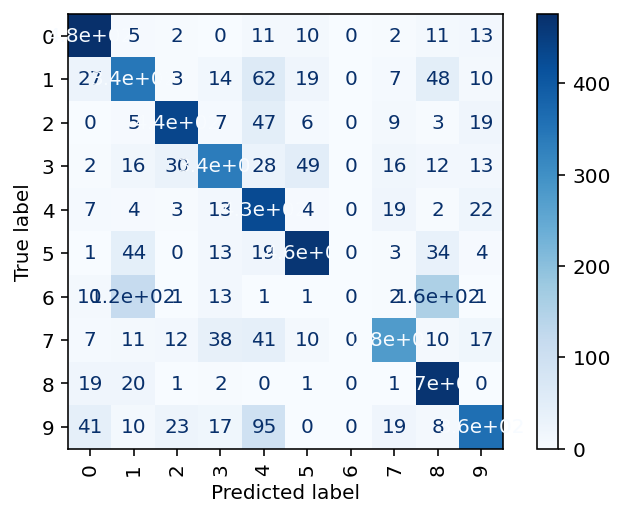

In [ ]:
### EVALUATION AND PERFORMANCE
printperformanceandconfmatrix(acc_trainRF,acc_testRF,P_test_lda,Y_test,rfFDA,"RF")

### 3.4 Summary of Classification Task
We have concluded that, even tough the visualization of the TSNE reflects better in some clusters the discipline,FDA is more adequate to improve prediction targets.

## 4.Word2vec + Probabilistic PCA + FDA (Fisher Discriminant Analysis)
The last approach is likely to the previous one just that we encode the dimensions in a probabilistic way. Some code pieces are got from a file of Pablo Martinez Olmos. The procedure is equal to the other one just to give more dynamism to our classification task, we have merge the vector representations of abstracts- document with the vector representation of the keywords.
We need to remove some rows, the ones whose Keywords has no mapping for the pretrain word2vec network. This implies that the rows of the clean lemmas has to be also removed the ones for which the keywords are none. We are also going to give more weight to the train size than for the test one.

In [ ]:
def word2vecnoscale(corpustrain,corpustest,y_train,y_test):
  ### CONVERT DOCUMENTS TO VEC BY THE AVERAGE MEAN OFABSTRACT WORDS
  train=corpustrain.apply(doc2vec)
  test=corpustest.apply(doc2vec)
  ### REMOVE ALL NONE VALUES 
  train.dropna(axis=0,inplace=True)
  test.dropna(axis=0,inplace=True)
  ### UPDATE THE TARGET VALUES
  
  y_train=y_train[train.index.values]
  y_test=y_test[test.index.values]

  # ### CONVERT PD SERIES TO NUMPY FOR SCALING COMPUTATION
  # arraytrain=np.array(train.to_list())
  # arraytest=np.array(test.to_list())
  
  # ### SCALE THE DATA
  # sc_train,sc_test=scalingdata(arraytrain,arraytest)
  #### WE NEED TO RETURN THE INDECES THAT WE ARE GOING TO REMOVE BECAUSE DOES NOT HAVE KEYWORDS
  #### OR IT IS CORRESPOND VECTOR REPRESANTION IS NOT FOUND IN THE WORD2VEC

  return train,test,y_train,y_test,train.index.values,test.index.values


In [ ]:
### WE AGAIN LOAD THE DATA
df_spring = pd.read_excel(local_folder + 'Task 2 CheckPoints/' + 'spring_df_15topics.xlsx')
df_spring["Keywords"]=df_spring["Keywords"].apply(tolist)
df_spring["clean_lemmas"]=df_spring["clean_lemmas"].str.split().to_list()
data=df_spring.drop(["target"],axis=1)


In [ ]:
#### NOW WE GIVE MORE WEIGHT TO THE TRAIN
x_train, x_val, y_train, y_val = train_test_split(data, df_spring["target"], test_size=0.2, random_state=42)

In [ ]:
### WE DISCRETIZE THE TARGET
Y_train=y_train.astype("category").cat.codes.astype("int")
Y_test=y_val.astype("category").cat.codes.astype("int")

In [ ]:
### THIS PROCESS INVOLVE IN SEVERAL STEPS:


### LOOKING FOR VECTORIAL REPRESENTATION OF CLEAN LEMMAS AND FOR KEYWORDS

#### VECTORIAL REPRESENTATION OF CLEAN LEMMAS NO SCALED.
[train,test,y_train,y_test,train_idx,test_idx]=word2vecnoscale(x_train["clean_lemmas"],x_val["clean_lemmas"],Y_train,Y_test)

#### VECTORIAL REPRESENTATION OF KEYWORDS NO SCALED.
[trainkey,testkey,y_trainkey,y_testkey,train_idxkey,test_idxkey]=word2vecnoscale(x_train["Keywords"],x_val["Keywords"],Y_train,Y_test)
### WE LOCATE ALL THE ROWS THAT ARE NONE VALUES FOR THE TARGET AS WELL AS FOR THE INPUT VARIABLES
Y_train=y_train[train_idxkey]
Y_test=y_test[test_idxkey]
train=train.loc[train_idxkey]
test=test.loc[test_idxkey]

### WE MERGE THE VECTORIAL REPRESENTATION OF THE CLEAN LEMMAS + VECTORIAL REPRESENTATION OF KEYWORDA
Train=np.hstack((np.array(train.to_list()),np.array(train.to_list())))
Test=np.hstack((np.array(test.to_list()),np.array(test.to_list())))

### 4.1PPCA Interpretation and Closed Form Solution
The dimension reduction  of the PPCA is got from a posterior distribution $p(z|x)$ whose parameters that are conditioned by the likelihood of the density maximizes the marginal density $p(x)$ . Therefore is an statistical way to transform our x points  to a low dimensional space:

$f(z|x)$: $\mathbf{x}\in\mathbb{R}^K$ ----> $\mathbf{z}\in\mathbb{D}^D$

where $D$<$K$ 

$f(z|x)= \frac{f(x|z)f(z)}{f(x)}$

The parameters are obtained maximizing the likelihood of the data or maximing the decoder density:

\begin{align}
\mathbf{\mu}_{\text{ML}} &= \overline{\mathbf{x}}=\frac{1}{N}\sum_{i=1}^{N}\mathbf{x}^{(i)}\\
\\
\sigma^2_{\text{ML}} &= \frac{1}{D-M}\sum_{i=M+1}^{D}\lambda_i\\
\\
\mathbf{W}_{\text{ML}} &=\mathbf{U}_{M} \left( \mathbf{L}_{M} - \sigma^2_{\text{ML}}\mathbf{I}\right)^{1/2} \mathbf{R}
\end{align}

Therefore our posterior distribution will follow a gaussian distribution so that the projection of the mean will be the information that we will retain as eigenvectors. We have also the variance information but we will forget for the projection because we are going to take all the possible eigenvectors. We will retain the maximum possible quantity.

$$z|x = \mathcal{N}(\mathbf{z}|\mathbf{M_{ML}}^{-1}\mathbf{W_{ML}}^T(\mathbf{x}-\mathbf{\mu_{ML}}),\sigma^{-2}\mathbf{M_{ML}})$$



*WARNING!!! The maximum likelihood parameters written in latex are got from a jupyter of Pabo Martinez Olmos as well as the last expression of the posterior distribution*

In [ ]:
### WE SCALE THE DATA
sc_train,sc_test=scalingdata(Train,Test)

In [ ]:
### COMPUTATION OF EIGVALUES/EIGVECTORS
N,D = sc_train.data.shape

### WE COMPUTE THE EIGENS OF THE COVARIANCE MATRIX
S = np.cov(sc_train.T)
u, s, vh = np.linalg.svd(S)

In [ ]:
def closedsolutionofprobPCA(sc_train,n_components,u, s, vh):
        ### THE CODE IS GOT FROM PABLO MARTINEZ OLMOS AND IT IS NEEDED TO COMPUTE 
        ### THE DIMENSIONALITY REDUCTION OR IN FACT THE PARAMETERS OF THE POSTERIOR DISTRIBUTION
        ### DENSITY (ENCODER IT IS SAID IN NEURAL NETWORK)
        
        mu_ML = np.mean(sc_train,0)
        U_m = u[:,:n_components]
        L_m = np.diag(s[:n_components])
        sigma2_ML = 1./(D-n_components)*np.sum(s[n_components:])
        
        W_ML = U_m @(L_m - sigma2_ML*np.eye(n_components))**(1/2)@np.eye(n_components)
        M = W_ML.T@W_ML + sigma2_ML*np.eye(n_components)
        mean_projected = np.transpose(np.linalg.pinv(M)@W_ML.T@(sc_train-mu_ML).T)
        sigma_projected= (sigma2_ML**(-1))*M
        return mean_projected,sigma_projected

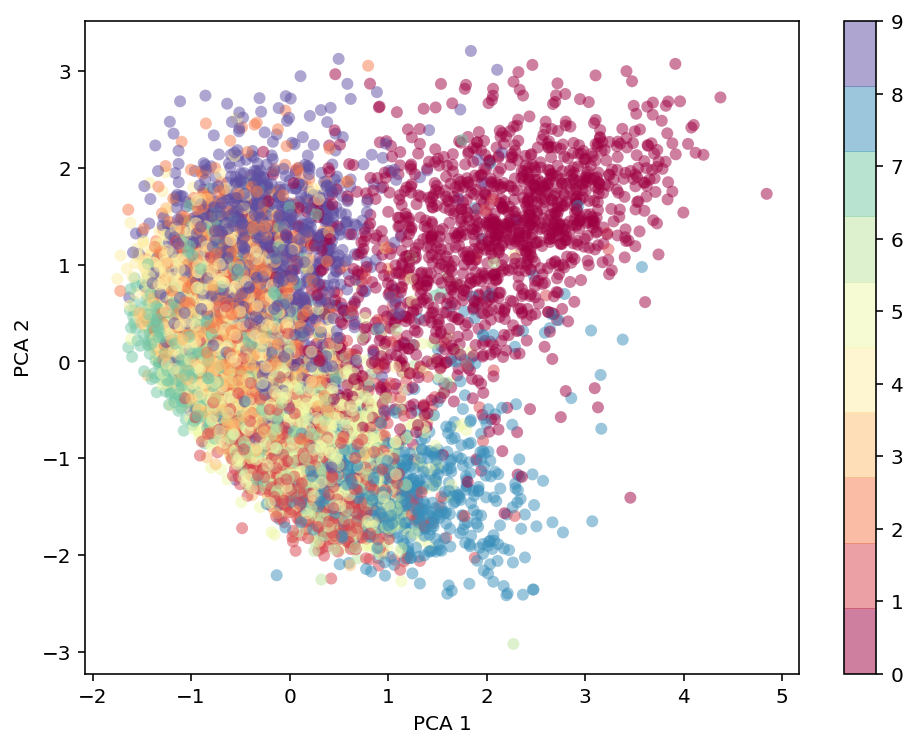

In [ ]:
#### THIS IS A PLOT WITH THE TWO FIRST COMPONENTS OF THE PCA.
#### WHICH IN FACT IS THE EXPECTED VALUE OF THE ENCODER OR MTHE POSTERIOR MEAN.
#### WE TAKE 2 COMP TO PLOT AND SEE THE RELATIONSHIP BETWEEN TO COMPONENTS
Pca_train,var_train=closedsolutionofprobPCA(sc_train,2,u, s, vh)
Pca_test,var_test=closedsolutionofprobPCA(sc_test,2,u, s, vh)
plt.figure(figsize=(8,6))
plt.scatter(Pca_train[:, 0], Pca_train[:, 1],
            c=Y_train.to_numpy(), edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('Spectral', 10))
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar();

### 4.2 Implementation of the PPCA and evaluation of the clasifiers

In [ ]:
### We are going to take all the possible information for that reason we take all the possible
### components we can take
postmu_train,var_train=closedsolutionofprobPCA(sc_train,599,u, s, vh)
postmu_test,var_test=closedsolutionofprobPCA(sc_test,599,u, s, vh)

We again implement FDA

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
setdisciplines=set(Y_train)
N_feat_max = len(setdisciplines)-1 # As many new features as classes minus 1
# FISHER DISCRIMINANT ANALYSIS
lda = LinearDiscriminantAnalysis(n_components=N_feat_max)
lda.fit(Pca_train, Y_train)
P_train_lda = lda.transform(postmu_train)
P_test_lda = lda.transform(postmu_test)

#### 4.1.1 KNN (K Nearest Neighbours)

In [ ]:
### EVALUATION OF KNN WITH FISHER
knnPPCA = GridSearchCV(KNeighborsClassifier(weights="distance"),{
        'n_neighbors': np.arange(60,80,20),
        'metric':['euclidean','manhattan','minkowski','chebyshev','cosine','canberra'] },cv = 5,refit=True)
knnPPCA.fit(P_train_lda,Y_train)
dfKNN = pd.DataFrame(knnPPCA.cv_results_) # Visualize in a better way the results
print("KNN_best parameters: ",knnPPCA.best_params_)
print("KNN_best score: ",knnPPCA.best_score_)

KNN_best parameters:  {'metric': 'manhattan', 'n_neighbors': 60}
KNN_best score:  0.8163006884735662


Accuracy train with : KNN with PPCA  1.0 
Accuracy test  with : KNN with PPCA  0.7986481679117752 


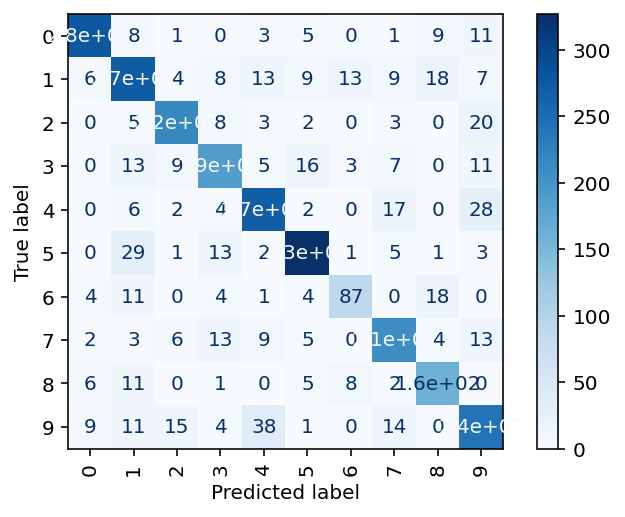

In [ ]:
### PREDICTION TASK
y_pred_train=knnPPCA.predict(P_train_lda)
y_pred_test=knnPPCA.predict(P_test_lda)
acc_trainKNNPPCA=(y_pred_train==Y_train).tolist().count(True)/len(Y_train)
acc_testKNNPPCA=(y_pred_test==Y_test).tolist().count(True)/len(Y_test)
printperformanceandconfmatrix(acc_trainKNNPPCA,acc_testKNNPPCA,P_test_lda,Y_test,knnPPCA,"KNN with PPCA")

#### 4.1.2 SVM (Support Vector Machine)

Accuracy train with : SVMPPCA  0.829677189227751 
Accuracy test  with : SVMPPCA  0.7990039131981501 


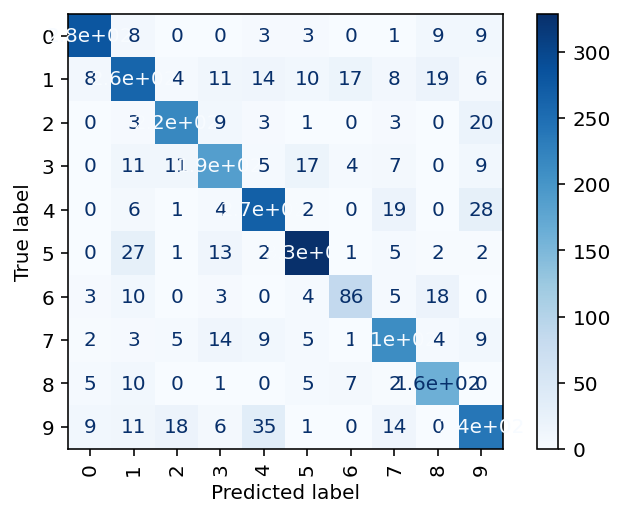

In [ ]:

SVMPPCA = SVC(kernel="rbf",C=1,gamma="scale")
SVMPPCA.fit(P_train_lda, Y_train)
y_pred_trainSVMPPCA=SVMPPCA.predict(P_train_lda)
y_pred_testSVMPPCA=SVMPPCA.predict(P_test_lda)
acc_trainSVMPPCA=(y_pred_trainSVMPPCA==Y_train).tolist().count(True)/len(Y_train)
acc_testSVMPPCA=(y_pred_testSVMPPCA==Y_test).tolist().count(True)/len(Y_test)
printperformanceandconfmatrix(acc_trainSVMPPCA,acc_testSVMPPCA,P_test_lda,Y_test,SVMPPCA,"SVMPPCA")

#### 4.1.3 Summary of the last approach done.
The summary of the last approach is that the improvement with respect to point 3 is not drastic, actually is very few. The case is that we have made this approach of PCA because how we have merged 300 columns that represented the clean lemmas and other 300 columns that represented the keywords, we thought that some vectorial representations of the keywords could produce some redundancy with the vectorial representation of the clean lemmas and the same reciprocally. This is when PCA approach goes in, to remove these correlations. However, the improvement of the accuracy with this implementation is very few so that we conclude that there is no much redundancy between both vectorial represantions, therefore, probabilistic PCA is not specially relevant to improve the prediction.